In [10]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
core_files = {
    '1x_1x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_1x_1x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '3x_3x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_3x_3x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '6x_6x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_6x_6x /round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '1x_6x_cs' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/amp_load_balancer/output_without_dynamic.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/amp_load_balancer/output_without_dynamic.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_1x_6x/amp_load_balancer/output_1ms.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_3x_6x/amp_load_balancer/output_1ms.csv'
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        
        ge_key = core_config[:5]
        if ge_key in core_ge:
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000000 # seconds
    return df[['processing_delay']]  # Return only the relevant column


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '(S,S)': r'$\mathbf(S,S)$',
        '(M,M)': r'$\mathbf(M,M)$',
        '(L,L)' : r'$\mathbf(L,L)$',
        '(S,L)' : r'$\mathbf(S,L)$',
        '(M,L)' : r'$\mathbf(M,L)$',
    }
        
        
    # Initialize data containers
    latency_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    print(combined_df)


{'1x_1x': 9.139703053238298, '3x_3x': 10.733438314969545, '6x_6x': 9.763496010625833, '1x_6x_cs': 10.637671231062027, '3x_6x_cs': 10.758005650043282}
Core Config : 1x_1x
Core Config : 3x_3x
Core Config : 6x_6x
Core Config : 1x_6x_cs
Core Config : 3x_6x_cs
         processing_delay core_type
0                0.000002     1x_1x
1                0.000002     1x_1x
2                0.000002     1x_1x
3                0.000003     1x_1x
4                0.000003     1x_1x
...                   ...       ...
7999995          0.244922  3x_6x_cs
7999996          0.244926  3x_6x_cs
7999997          0.244922  3x_6x_cs
7999998          0.244926  3x_6x_cs
7999999          0.244927  3x_6x_cs

[8000000 rows x 2 columns]


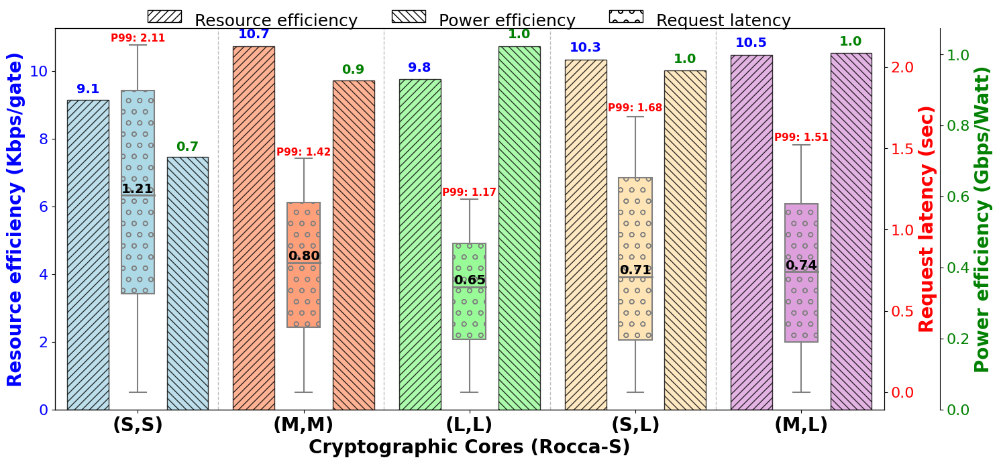

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\\\\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(15, 7))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()
ax2.spines["right"].set_position(("outward", 60))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax2.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax2.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='green')

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('o')   
    patch.set_alpha(1.0)         

# Annotate Median and P99
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i]  # Center position for latency annotations
        ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=14, fontweight='bold', color='black')
        ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
                 fontsize=11, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency (Kbps/gate)', fontsize=20, fontweight='bold', color='blue')
ax2.set_ylabel('Power efficiency (Gbps/Watt)', fontsize=20, fontweight='bold', color='green')
ax3.set_ylabel('Request latency (sec)', fontsize=20, fontweight='bold', color='red')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='green')
ax3.tick_params(axis='y', labelcolor='red')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 20,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=20, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\\\\\', label='Power efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=18, frameon=False)

ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
ax3.tick_params(axis='y', labelsize=16)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.show()

On request length MMTC Dataset

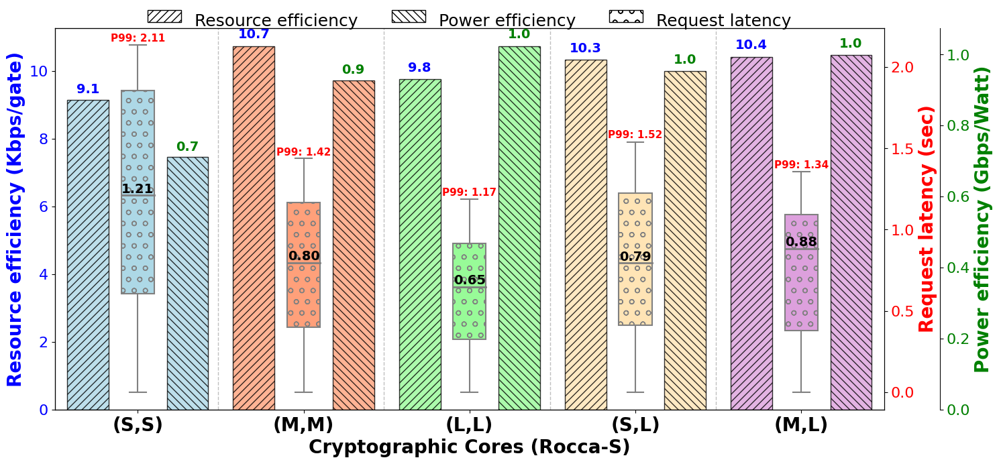

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\\\\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(15, 7))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()
ax2.spines["right"].set_position(("outward", 60))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax2.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax2.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='green')

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('o')   
    patch.set_alpha(1.0)         

# Annotate Median and P99
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i]  # Center position for latency annotations
        ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=14, fontweight='bold', color='black')
        ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
                 fontsize=11, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency (Kbps/gate)', fontsize=20, fontweight='bold', color='blue')
ax2.set_ylabel('Power efficiency (Gbps/Watt)', fontsize=20, fontweight='bold', color='green')
ax3.set_ylabel('Request latency (sec)', fontsize=20, fontweight='bold', color='red')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='green')
ax3.tick_params(axis='y', labelcolor='red')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 20,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=20, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\\\\\', label='Power efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=18, frameon=False)

ax1.tick_params(axis='y', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
ax3.tick_params(axis='y', labelsize=16)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.show()

Experiment-2 Relative baseline to (SS), Plot relative values for (S, S), (M, M), (L, L), (S, L), (M, L) for both workloads. This is for Mmtc Dataset



In [3]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
core_files = {
    '1x_1x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_1x_1x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '3x_3x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_3x_3x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '6x_6x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Mmtc_12G/rocca_6x_6x /round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '1x_6x_cs' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/amp_load_balancer/output.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/amp_load_balancer/output.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_1x_6x/amp_load_balancer/output_1ms.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_3x_6x/amp_load_balancer/output_1ms.csv'
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

throughput_per_ge_kbps_1x_1x=0.0
throughput_per_watt_gbps_1x_1x=0.0

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        

        ge_key = core_config[:5]
        if ge_key in core_ge:
            
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            if core_config == '1x_1x':
                throughput_per_ge_kbps_1x_1x = throughput_per_ge_kbps
                
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps/throughput_per_ge_kbps_1x_1x))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            
            if core_config == '1x_1x':
                throughput_per_watt_gbps_1x_1x = throughput_per_watt_gbps
            
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps/throughput_per_watt_gbps_1x_1x))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000000 # seconds
    return df[['processing_delay']]  # Return only the relevant column


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '(s,S)': r'$\mathbf(S,S)$',
        '(M,M)': r'$\mathbf(M,M)$',
        '(L,L)' : r'$\mathbf(L,L)$',
        '(S,L)' : r'$\mathbf(S,L)$',
        '(M,L)' : r'$\mathbf(M,L)$',
    }
        
        
    # Initialize data containers
    latency_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Capture the Median Latencies.
    relative_median_latencies = []
    
    first_median_latency = 0.0
    for i, df in enumerate(latency_data):
        if i==0:
            first_median_latency = df['processing_delay'].median()
        # print(df['core_type'][i])
        
        print("Median Latency :",df['processing_delay'].median())
        
        print("Relative Median Latency :",df['processing_delay'].median()/first_median_latency)
        relative_median_latencies.append(df['processing_delay'].median()/first_median_latency)


    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    # print(combined_df)





{'1x_1x': 1.0, '3x_3x': 1.1743749498695768, '6x_6x': 1.0682508998108553, '1x_6x_cs': 1.1638968103337868, '3x_6x_cs': 1.1770629294385666}
Core Config : 1x_1x
Core Config : 3x_3x
Core Config : 6x_6x
Core Config : 1x_6x_cs
Core Config : 3x_6x_cs
Median Latency : 1.2111908562180829
Relative Median Latency : 1.0
Median Latency : 0.7971789821896422
Relative Median Latency : 0.6581778405088164
Median Latency : 0.6487720855501704
Relative Median Latency : 0.5356481038636199
Median Latency : 0.7395151228592005
Relative Median Latency : 0.6105686144034479
Median Latency : 0.14588100321170816
Relative Median Latency : 0.120444273883654


[1.0, 0.6581778405088164, 0.5356481038636199, 0.4948147347217835, 0.340754502727757]


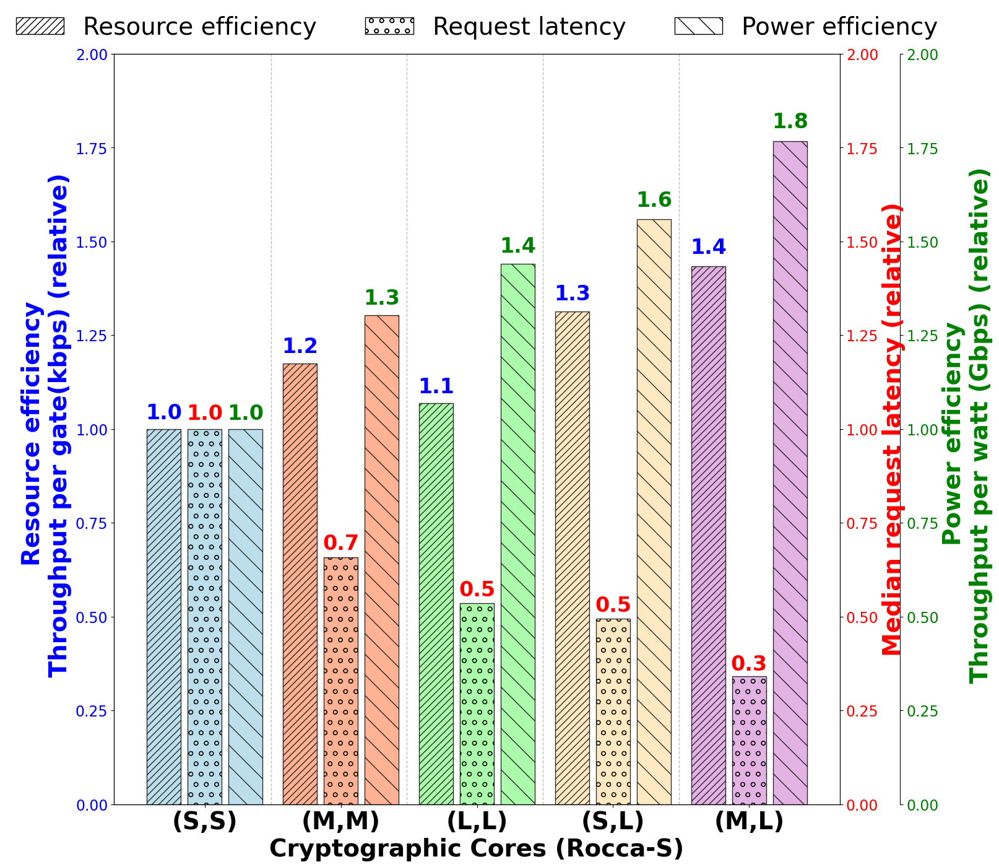

In [7]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(16, 14))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax2 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax3.spines["right"].set_position(("outward", 70))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate(kbps) (relative)', fontsize=28, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=28, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (Gbps) (relative)', fontsize=28, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)
ax3.tick_params(axis='y', labelsize=17)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 28,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=28, fontweight='bold')

# ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent + 0.2, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.08),
           ncol=3, fontsize=28,  title_fontsize=14, frameon=False)

# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.1),
#            ncol=3, fontsize=26, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# Force same y-limits for visual alignment
ax1.set_ylim(0, 2.0)  # Resource efficiency
ax2.set_ylim(0, 2.0)  # Request latency
ax3.set_ylim(0, 2.0)  # Power efficiency


ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.show()

On request FlexMesh logic on relative dataset result

[1.0, 0.6581778405088164, 0.5356481038636199, 0.6560181351038327, 0.728179190544266]


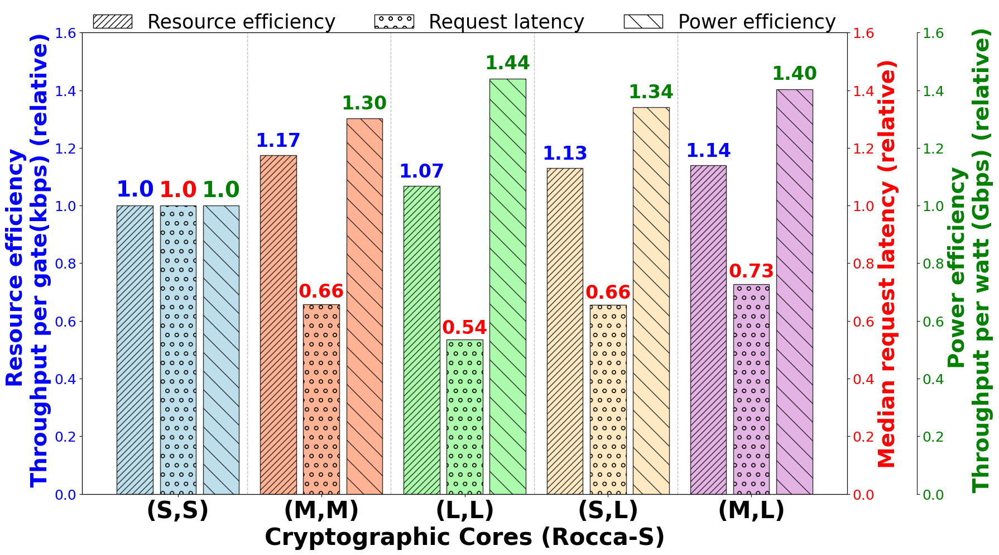

In [4]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(18, 10))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax2 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax3.spines["right"].set_position(("outward", 90))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate(kbps) (relative)', fontsize=28, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=28, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (Gbps) (relative)', fontsize=28, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='y', labelsize=18)
ax3.tick_params(axis='y', labelsize=18)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=30, fontweight='bold')

# ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent + 0.2, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.08),
           ncol=3, fontsize=25,  title_fontsize=14, frameon=False)

# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.1),
#            ncol=3, fontsize=26, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# Force same y-limits for visual alignment
ax1.set_ylim(0, 1.6)  # Resource efficiency
ax2.set_ylim(0, 1.6)  # Request latency
ax3.set_ylim(0, 1.6)  # Power efficiency


ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/RoccaS_throughput_efficiency_latency_comparison_relative.png", dpi=300)
plt.show()

MMTC with respect to flexMesh

[1.0, 0.6581778405088164, 0.5356481038636199, 0.6105686144034479, 0.6841388659429688]


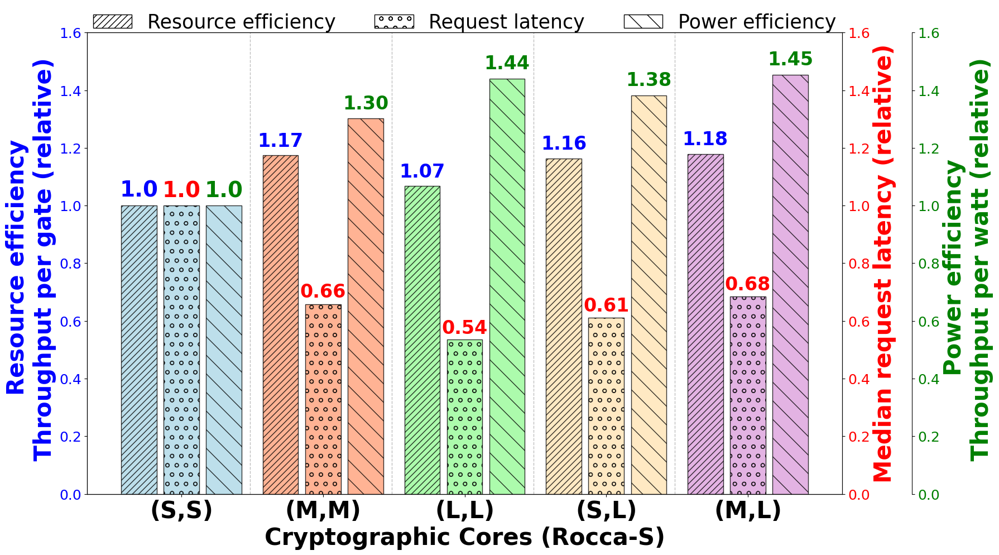

In [7]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(18, 10))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax2 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax3.spines["right"].set_position(("outward", 90))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=30, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=30, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=30, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='y', labelsize=18)
ax3.tick_params(axis='y', labelsize=18)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=30, fontweight='bold')

# ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent + 0.2, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.08),
           ncol=3, fontsize=25,  title_fontsize=14, frameon=False)

# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.1),
#            ncol=3, fontsize=26, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# Force same y-limits for visual alignment
ax1.set_ylim(0, 1.6)  # Resource efficiency
ax2.set_ylim(0, 1.6)  # Request latency
ax3.set_ylim(0, 1.6)  # Power efficiency


ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/flexmesh_MMTC.png", dpi=300)
plt.show()

Update in Color codings

[1.0, 0.6581778405088164, 0.5356481038636199, 0.6105686144034479, 0.120444273883654]


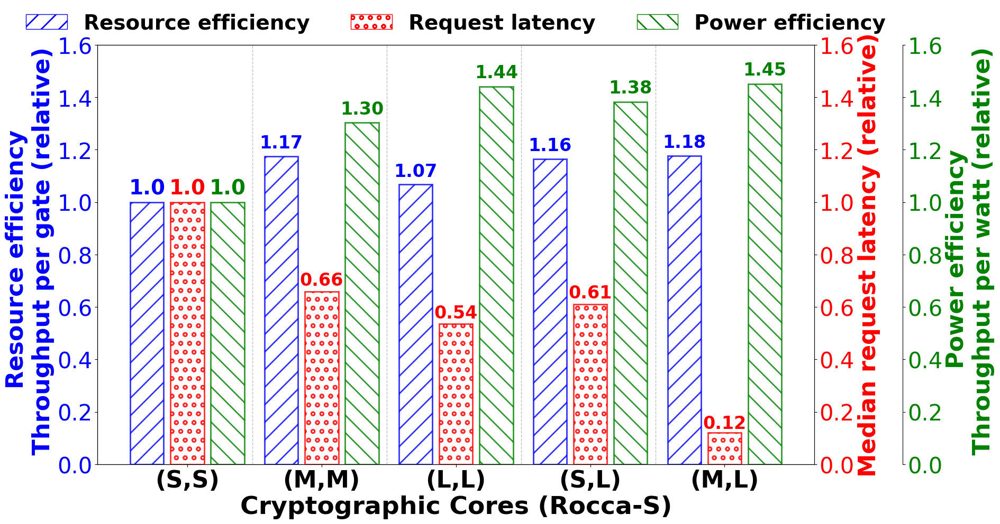

In [50]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2
# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}

metric_colors = {
    # "resource": "#064d83",     # Throughput / gate
     "resource": "blue",    
    "power": "green",       # Throughput / watt
    # "latency": "#cc5500",       # Request latency
     "latency": "red",       # Request latency
    "ooo": "purple"         # OOO memory
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['/', '\\', '---', '\\\///', '+','o']

fig, ax1 = plt.subplots(figsize=(19, 10))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax2 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax3.spines["right"].set_position(("outward", 120))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], fill = False, edgecolor=metric_colors["resource"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], fill = False,edgecolor=metric_colors["power"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], fill = False, edgecolor=metric_colors["latency"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color="red")
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color="red")

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=32, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=32, fontweight='bold', color="red")
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=32, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=30)
ax2.tick_params(axis='y', labelsize=30)
ax3.tick_params(axis='y', labelsize=30)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 34,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)

ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=32, fontweight='bold')

# ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent + 0.2, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["resource"], hatch='/', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["latency"], hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["power"], hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.08),
#            ncol=3, fontsize=25,  title_fontsize=14, frameon=False)
ax1.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3,
    prop={'size': 28, 'weight': 'bold'},
    title_fontsize=14,
    frameon=False
)

# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.1),
#            ncol=3, fontsize=26, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# Force same y-limits for visual alignment
ax1.set_ylim(0, 1.6)  # Resource efficiency
ax2.set_ylim(0, 1.6)  # Request latency
ax3.set_ylim(0, 1.6)  # Power efficiency


ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/flexmesh_MMTC_update.pdf", dpi=300)
plt.show()

Royalblue

[1.0, 0.6581778405088164, 0.5356481038636199, 0.6105686144034479, 0.120444273883654]


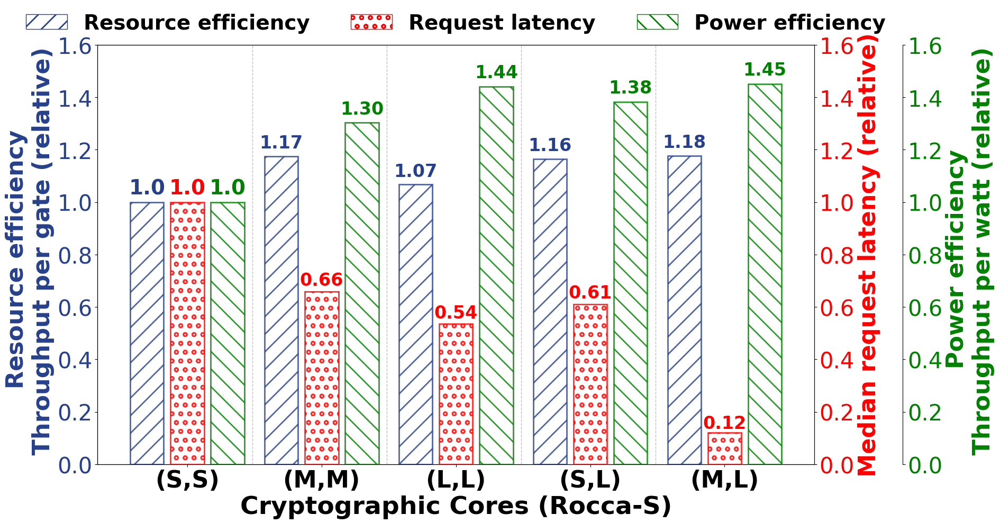

In [6]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2
# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}

metric_colors = {
    # "resource": "#064d83",     # Throughput / gate
     "resource": "#27408B",    
    "power": "green",       # Throughput / watt
    # "latency": "#cc5500",       # Request latency
     "latency": "red",       # Request latency
    "ooo": "purple"         # OOO memory
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['/', '\\', '---', '\\\///', '+','o']

fig, ax1 = plt.subplots(figsize=(19, 10))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
ax2 = ax1.twinx()

# Second right Y-axis for Throughput per Watt (push it outward)
ax3.spines["right"].set_position(("outward", 120))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], fill = False, edgecolor=metric_colors["resource"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color="#27408B")
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color="#27408B")

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], fill = False,edgecolor=metric_colors["power"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], fill = False, edgecolor=metric_colors["latency"],
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color="red")
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color="red")

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=32, fontweight='bold', color="#27408B")
ax2.set_ylabel('Median request latency (relative)', fontsize=32, fontweight='bold', color="red")
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=32, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor="#27408B")
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=30)
ax2.tick_params(axis='y', labelsize=30)
ax3.tick_params(axis='y', labelsize=30)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 34,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)

ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=32, fontweight='bold')

# ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent + 0.2, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["resource"], hatch='/', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["latency"], hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["power"], hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.08),
#            ncol=3, fontsize=25,  title_fontsize=14, frameon=False)
ax1.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3,
    prop={'size': 28, 'weight': 'bold'},
    title_fontsize=14,
    frameon=False
)

# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.1),
#            ncol=3, fontsize=26, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# Force same y-limits for visual alignment
ax1.set_ylim(0, 1.6)  # Resource efficiency
ax2.set_ylim(0, 1.6)  # Request latency
ax3.set_ylim(0, 1.6)  # Power efficiency


ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/flexmesh_MMTC_update.pdf", dpi=300)
plt.show()

5-G Video streaming Relative to basline Small


In [7]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
core_files = {
    '1x_1x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Youtube_Dataset_0.088G/rocca_1x_1x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '3x_3x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Youtube_Dataset_0.088G/rocca_3x_3x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '6x_6x': '/home/iiitd/Aditya/Plot_RoccaS/Symmetric_Cores/Youtube_Dataset_0.088G/rocca_6x_6x /round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',

    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_1x_6x/amp_load_balancer_1x_6x/output.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_3x_6x/amp_load_balancer_3x_6x/output.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_1x_6x/amp_load_balancer_1x_6x/output_1ms.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Youtube_Dataset_0.088G/rocca_3x_6x/amp_load_balancer_3x_6x/output_1ms.csv',
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

throughput_per_ge_kbps_1x_1x=0.0
throughput_per_watt_gbps_1x_1x=0.0

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        

        ge_key = core_config[:5]
        if ge_key in core_ge:
            
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            if core_config == '1x_1x':
                throughput_per_ge_kbps_1x_1x = throughput_per_ge_kbps
                
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps/throughput_per_ge_kbps_1x_1x))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            
            if core_config == '1x_1x':
                throughput_per_watt_gbps_1x_1x = throughput_per_watt_gbps
            
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps/throughput_per_watt_gbps_1x_1x))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000000 # seconds
    return df[['processing_delay']]  # Return only the relevant column


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '(s,S)': r'$\mathbf(S,S)$',
        '(M,M)': r'$\mathbf(M,M)$',
        '(L,L)' : r'$\mathbf(L,L)$',
        '(S,L)' : r'$\mathbf(S,L)$',
        '(M,L)' : r'$\mathbf(M,L)$',
    }
        
        
    # Initialize data containers
    latency_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Capture the Median Latencies.
    relative_median_latencies = []
    
    first_median_latency = 0.0
    for i, df in enumerate(latency_data):
        if i==0:
            first_median_latency = df['processing_delay'].median()
        # print(df['core_type'][i])
        
        print("Median Latency :",df['processing_delay'].median())
        
        print("Relative Median Latency :",df['processing_delay'].median()/first_median_latency)
        relative_median_latencies.append(df['processing_delay'].median()/first_median_latency)


    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    # print(combined_df)

{'1x_1x': 1.0, '3x_3x': 0.8429936718622033, '6x_6x': 0.6588119671830154, '1x_6x_cs': 0.7943178362869461, '3x_6x_cs': 0.7396087813145449}
Core Config : 1x_1x
Core Config : 3x_3x
Core Config : 6x_6x
Core Config : 1x_6x_cs
Core Config : 3x_6x_cs
Median Latency : 4.648882422596216e-06
Relative Median Latency : 1.0
Median Latency : 3.1446498222649096e-06
Relative Median Latency : 0.6764313519696951
Median Latency : 2.3475703299045563e-06
Relative Median Latency : 0.5049751997370439
Median Latency : 2.3670257031917574e-06
Relative Median Latency : 0.509160156790945
Median Latency : 2.3475703299045563e-06
Relative Median Latency : 0.5049751997370439


[1.0, 0.6764313519696951, 0.5049751997370439, 0.5091602205968692, 0.5049751292199783]


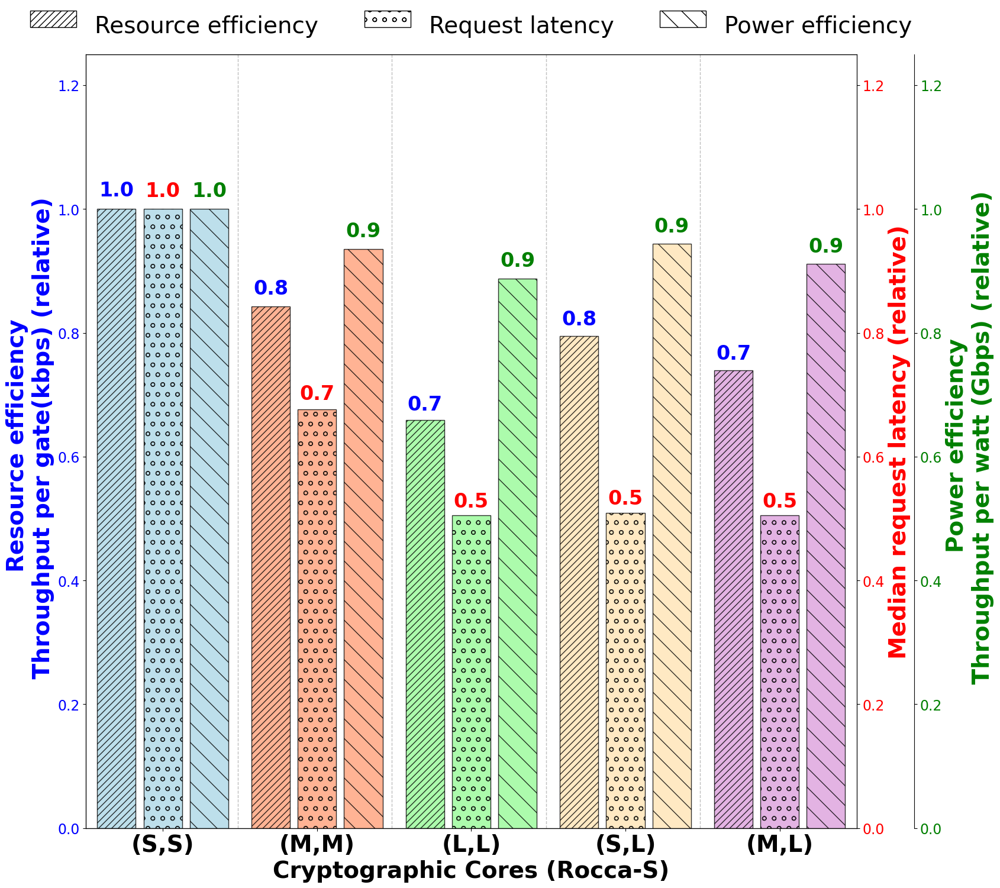

In [ ]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(17, 15))  # Wider figure to accommodate spacing

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

ax3.spines["right"].set_position(("outward", 70))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate(kbps) (relative)', fontsize=28, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=28, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (Gbps) (relative)', fontsize=28, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=17)
ax2.tick_params(axis='y', labelsize=17)
ax3.tick_params(axis='y', labelsize=17)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 28,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=28, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.set_ylim(0, 1.25)  # Resource efficiency
ax2.set_ylim(0, 1.25)  # Request latency
ax3.set_ylim(0, 1.25)  # Power efficiency

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=28, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.tight_layout()
plt.show()

Youtube dataset with request length logic relative experiment

[1.0, 0.6764313519696951, 0.5049751997370439, 0.5091602205968692, 0.5049751292199783]


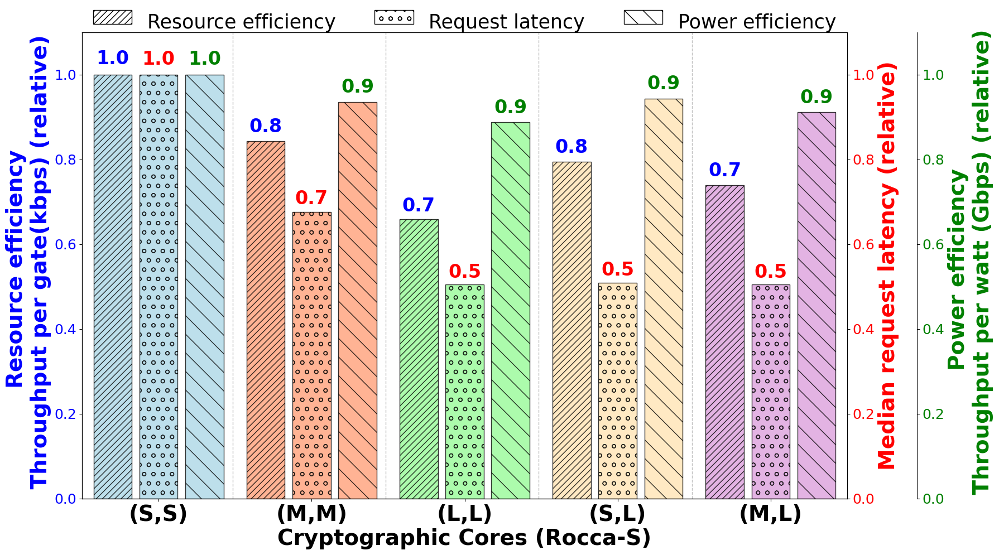

In [ ]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_amp', '3x_6x_amp']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_amp': '(S,L)',
    '3x_6x_amp': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(18, 10))  # Wider figure to accommodate spacing

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

ax3.spines["right"].set_position(("outward", 90))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate(kbps) (relative)', fontsize=28, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=28, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (Gbps) (relative)', fontsize=28, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='y', labelsize=18)
ax3.tick_params(axis='y', labelsize=18)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 28,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=28, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.set_ylim(0, 1.1)  # Resource efficiency
ax2.set_ylim(0, 1.1)  # Request latency
ax3.set_ylim(0, 1.1)  # Power efficiency

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=25, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/RoccaS_throughput_efficiency_latency_comparison_relative_wide_youtube.png", dpi=300)
plt.tight_layout()
plt.show()

Youtube experiment with respect to FlexMesh

[1.0, 0.6764313519696951, 0.5049751997370439, 0.509160156790945, 0.5049751997370439]


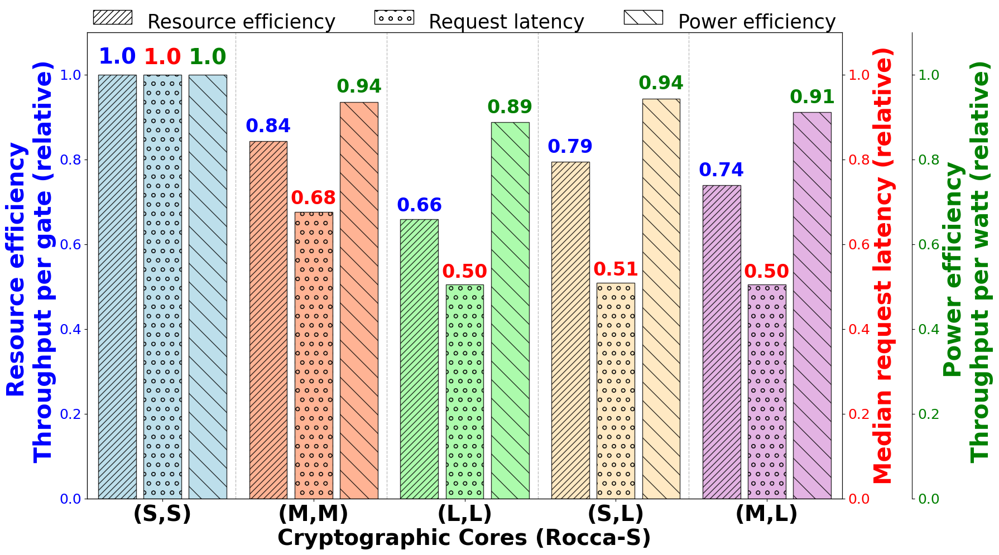

In [12]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(18, 10))  # Wider figure to accommodate spacing

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

ax3.spines["right"].set_position(("outward", 90))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=30, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=30, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=30, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=18)
ax2.tick_params(axis='y', labelsize=18)
ax3.tick_params(axis='y', labelsize=18)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 28,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=28, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.set_ylim(0, 1.1)  # Resource efficiency
ax2.set_ylim(0, 1.1)  # Request latency
ax3.set_ylim(0, 1.1)  # Power efficiency

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=25, frameon=False)

# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/youtube_flexmesh.png", dpi=450, bbox_inches='tight')
plt.tight_layout()
plt.show()

Update the COlor Codings of the Youtube Datset

[1.0, 0.6764313519696951, 0.5049751997370439, 0.509160156790945, 0.5049751997370439]


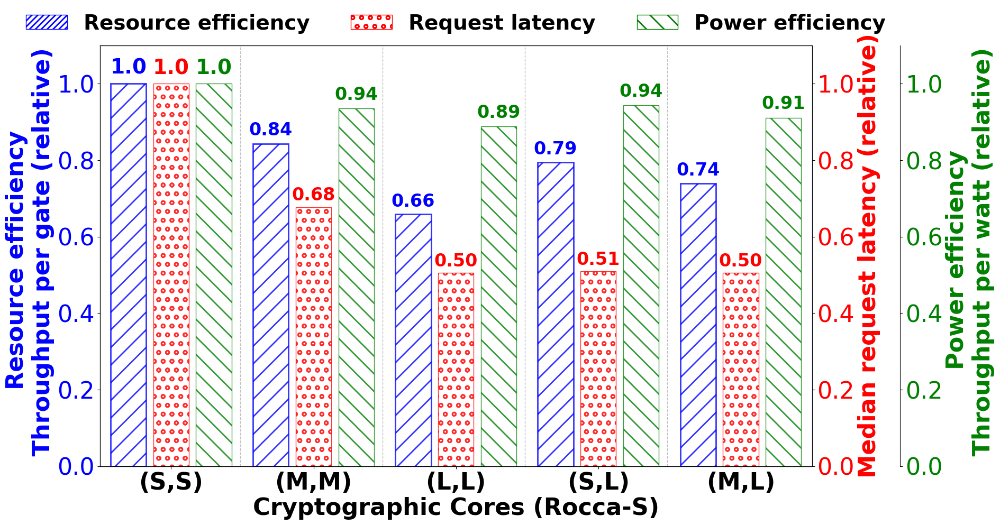

In [53]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}
metric_colors = {
    # "resource": "#064d83",     # Throughput / gate
    "resource": "blue",  
    "power": "green",       # Throughput / watt
    # "latency": "#cc5500",       # Request latency
     "latency": "red",       # Request latency
    "ooo": "purple"         # OOO memory
}


# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['/', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(19, 10))  # Wider figure to accommodate spacing

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

ax3.spines["right"].set_position(("outward", 120))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor=metric_colors["resource"],fill = False,
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='blue')
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor=metric_colors["power"],fill=False,
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor=metric_colors["latency"],fill=False,
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=32, fontweight='bold', color='blue')
ax2.set_ylabel('Median request latency (relative)', fontsize=32, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=32, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=32)
ax3.tick_params(axis='y', labelsize=32)
ax2.tick_params(axis='y', labelsize=32)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 32,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=32, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.set_ylim(0, 1.1)  # Resource efficiency
ax2.set_ylim(0, 1.1)  # Request latency
ax3.set_ylim(0, 1.1)  # Power efficiency

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["resource"], hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["latency"], hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["power"], hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.078),
#            ncol=3, fontsize=25, frameon=False)

ax1.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3,
    prop={'size': 28, 'weight': 'bold'},
    title_fontsize=14,
    frameon=False
)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/youtube_flexmesh_update.pdf", dpi=450, bbox_inches='tight')
plt.tight_layout()
plt.show()

Royal Blue

[1.0, 0.6764313519696951, 0.5049751997370439, 0.509160156790945, 0.5049751997370439]


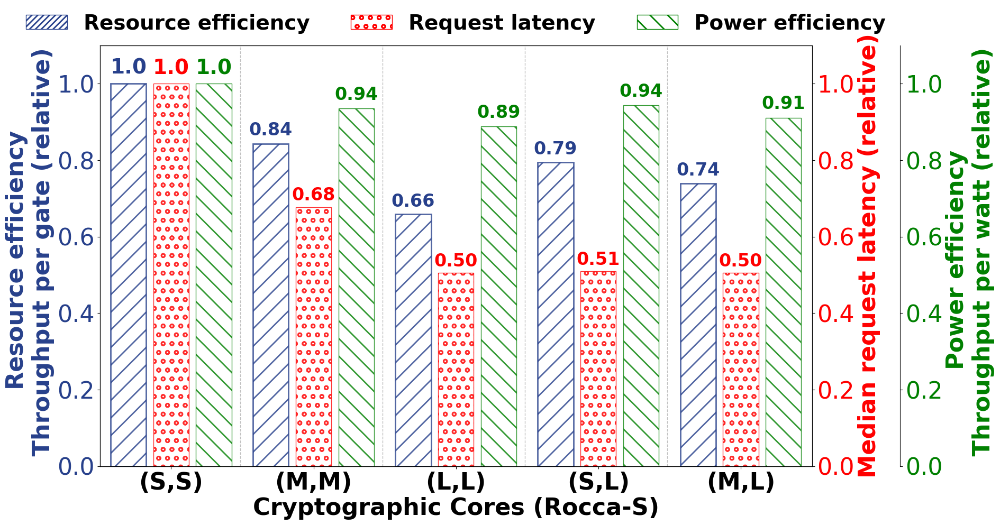

In [10]:
print(relative_median_latencies)
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}
metric_colors = {
    # "resource": "#064d83",     # Throughput / gate
    "resource": "#27408B",  
    "power": "green",       # Throughput / watt
    # "latency": "#cc5500",       # Request latency
     "latency": "red",       # Request latency
    "ooo": "purple"         # OOO memory
}


# Increase spacing between groups - much wider spacing
x = np.array([0, 2, 4, 6, 8]) # Consistent spacing of 2 units
bar_width = 0.5  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['/', '\\', '---', '\\\///', '+++','o']

fig, ax1 = plt.subplots(figsize=(19, 10))  # Wider figure to accommodate spacing

# Second right Y-axis for Throughput per Watt (push it outward)
ax2 = ax1.twinx()

# Right Y-axis for Request Latency (closer to the plot)
ax3 = ax1.twinx()

ax3.spines["right"].set_position(("outward", 120))


# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor=metric_colors["resource"],fill = False,
                  alpha=0.8, linewidth=2, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    if i == 0:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color="#27408B")
    else:
        ax1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color="#27408B")

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor=metric_colors["power"],fill=False,
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    if i == 0:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='green')
    else:
        ax3.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='green')

# Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

bar_latencies = []
for i, core in enumerate(core_types):
    val = relative_median_latencies[i]
    bar = ax2.bar(x[i] , relative_median_latencies[i], width=bar_width,
                  color=colors[i], hatch=hatches[5], edgecolor=metric_colors["latency"],fill=False,
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar_latencies.append(bar)
    if i == 0:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=28, fontweight='bold', color='red')
    else:
        ax2.text(x[i] , val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=24, fontweight='bold', color='red')

# Custom boxplot colors/hatch
# for i, patch in enumerate(box['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)         

# Annotate Median and P99
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=10, fontweight='bold', color='black')
#         ax3.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=10, color='red', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 0.97, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax1.set_ylabel('Resource efficiency \n Throughput per gate (relative)', fontsize=32, fontweight='bold', color="#27408B")
ax2.set_ylabel('Median request latency (relative)', fontsize=32, fontweight='bold', color='red')
ax3.set_ylabel('Power efficiency \n Throughput per watt (relative)', fontsize=32, fontweight='bold', color='green')

# ax1.set_xlabel

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor="#27408B")
ax2.tick_params(axis='y', labelcolor='red')
ax3.tick_params(axis='y', labelcolor='green')

ax1.tick_params(axis='y', labelsize=32)
ax3.tick_params(axis='y', labelsize=32)
ax2.tick_params(axis='y', labelsize=32)

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 32,fontweight='bold')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=32, fontweight='bold')

ax1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.set_ylim(0, 1.1)  # Resource efficiency
ax2.set_ylim(0, 1.1)  # Request latency
ax3.set_ylim(0, 1.1)  # Power efficiency

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["resource"], hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["latency"], hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor=metric_colors["power"], hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.078),
#            ncol=3, fontsize=25, frameon=False)

ax1.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.12),
    ncol=3,
    prop={'size': 28, 'weight': 'bold'},
    title_fontsize=14,
    frameon=False
)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 10)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/youtube_flexmesh_update.pdf", dpi=450, bbox_inches='tight')
plt.tight_layout()
plt.show()

Power efficiency with respect 'Smaller' core

/tmp/ipykernel_3915366/2643240838.py:49: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  plt.Rectangle((0,0),1,1, color=colors[0], hatch=hatches[0], edgecolor='black', label='M'),
/tmp/ipykernel_3915366/2643240838.py:50: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  plt.Rectangle((0,0),1,1, color=colors[1], hatch=hatches[1], edgecolor='black', label='L')
/tmp/ipykernel_3915366/2643240838.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


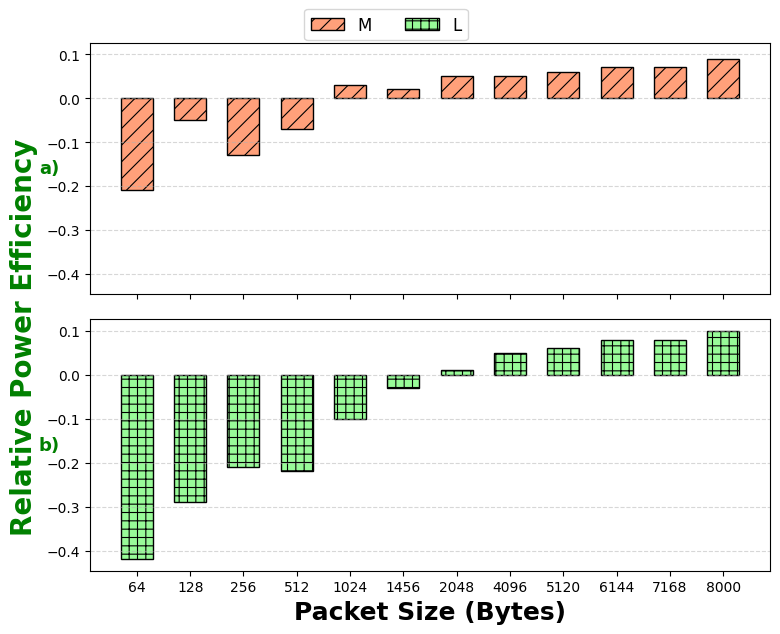

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Original packet sizes
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]
M_values = [-0.21, -0.05, -0.13, -0.07, 0.03, 0.02, 0.05, 0.05, 0.06, 0.07, 0.07, 0.09]
L_values = [-0.42, -0.29, -0.21, -0.22, -0.10, -0.03, 0.01, 0.05, 0.06, 0.08, 0.08, 0.10]

# Use equally spaced x positions
x = np.arange(len(packet_sizes))
bar_width = 0.6  # Adjust width relative to spacing

# Bar colors and hatches
colors = ['lightsalmon', 'palegreen']
hatches = ['//', '++']

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(8, 6), sharex=True, sharey=True, gridspec_kw={'hspace': 0.1})

# Subplot a) for M
axs[0].bar(x, M_values, width=bar_width, color=colors[0], edgecolor='black', hatch=hatches[0])

# Subplot b) for L
axs[1].bar(x, L_values, width=bar_width, color=colors[1], edgecolor='black', hatch=hatches[1])

# X-axis settings
axs[1].set_xlabel("Packet Size (Bytes)", fontsize=18, fontweight='bold')
axs[1].set_xticks(x)
axs[1].set_xticklabels(packet_sizes, rotation=0)

# Y-axis ticks and labels
for ax in axs:
    ax.tick_params(axis='both', labelsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Add subplot labels 'a)' and 'b)' on the left
axs[0].text(-0.06, 0.5, 'a)', transform=axs[0].transAxes,
            fontsize=13, fontweight='bold', color='green', va='center', ha='center')
axs[1].text(-0.06, 0.5, 'b)', transform=axs[1].transAxes,
            fontsize=13, fontweight='bold', color='green', va='center', ha='center')

# Add a single common y-axis label
fig.text(0.03, 0.5, 'Relative Power Efficiency', va='center', rotation='vertical',
         fontsize=20, fontweight='bold', color='green')

# Add legend
custom_handles = [
    plt.Rectangle((0,0),1,1, color=colors[0], hatch=hatches[0], edgecolor='black', label='M'),
    plt.Rectangle((0,0),1,1, color=colors[1], hatch=hatches[1], edgecolor='black', label='L')
]
# fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.00), ncol=2, fontsize=12)

custom_handles = [
    Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0], label='M'),
    Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1], label='L')
]
# fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.00), ncol=2, fontsize=12)
fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.06), ncol=2, fontsize=12)


# Layout adjustments
plt.tight_layout()
plt.subplots_adjust(left=0.13, right=0.98, top=0.99)
plt.show()


Rocca-S baseline 1x (3x, 6x)

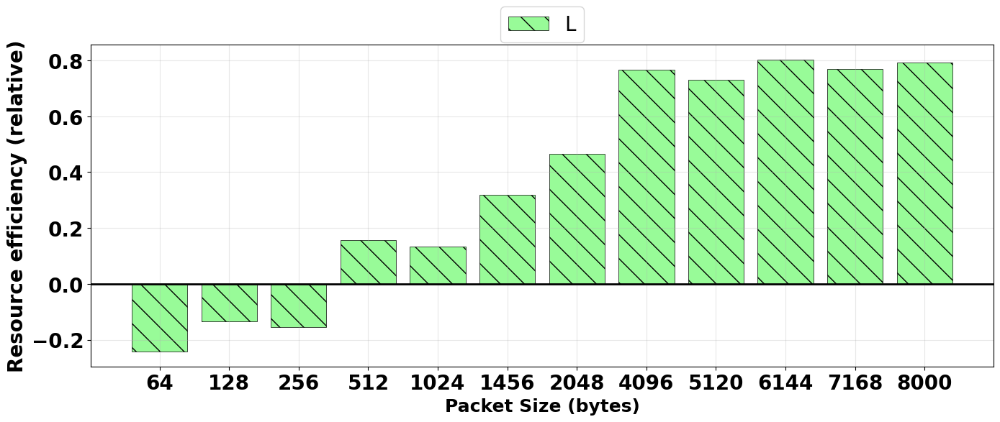

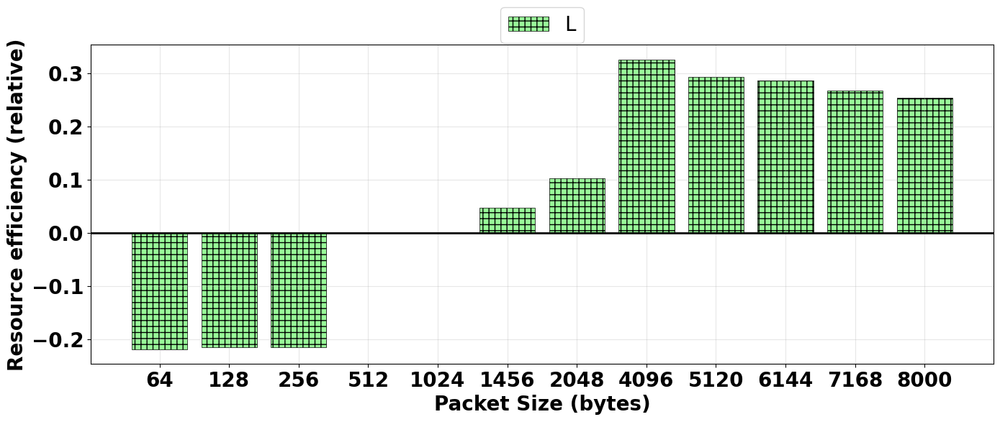

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

# y1 = [-0.03145418556, 0.1016134388, 0.07487426249, 0.1371087571, 0.170708773,
#       0.2583405005, 0.3278002635, 0.3321691194, 0.3380530578, 0.4013162638, 0.3964645291, 0.430564789]

# y2 = [-0.2184852757, -0.2144687586, -0.2145570899, 0.01653119284, -0.03206858477,
#       0.04761039567, 0.1030956984, 0.3261473357, 0.2935968399, 0.286909314, 0.2676107315, 0.2537176384]

# link : https://docs.google.com/spreadsheets/d/15_swJzJJ2WFeimwmNykQWrtLkmvaBr4VpazjVfvJ7rI/edit?gid=427274237#gid=427274237
# for the experiment
y1 = [-0.2430671848, -0.1346482278, -0.1557476312, 0.1559065212, 0.1331657995,
      0.3182505896, 0.4646907591, 0.7666525283, 0.7309012073, 0.8033669517,
      0.7701734233, 0.7935243089]

y2 = [-0.2184852757, -0.2144687586, -0.2145570899, 0, 0,
      0.04761039567, 0.1030956984, 0.3261473357, 0.2935968399, 0.286909314,
      0.2676107315, 0.2537176384]

# Design pattern
# colors = ['lightsalmon', 'palegreen']
colors = ['palegreen','palegreen']
hatches = ['\\', '++']
labels = ['L', 'L']

# Create first graph (y1)
plt.figure(figsize=(14, 6))
bars1 = plt.bar(range(len(packet_sizes)), y1, 
                color=colors[0], 
                hatch=hatches[0], 
                label=labels[0],
                edgecolor='black',
                linewidth=0.5)

plt.xlabel('Packet Size (bytes)', fontsize=18, fontweight='bold', color='black')
# plt.ylabel('Resource Efficiency (relative)')
plt.ylabel('Resource efficiency (relative)', fontsize=20, fontweight='bold', color='black')
plt.yticks(fontsize=20, fontweight='bold')
plt.xticks(range(len(packet_sizes)), packet_sizes, rotation=0, fontsize=20, fontweight='bold')
plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='black', linewidth=2)  # Bold line at y=0
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15),fontsize=20)
plt.tight_layout()
plt.show()

# Create second graph (y2)
plt.figure(figsize=(14, 6))
bars2 = plt.bar(range(len(packet_sizes)), y2, 
                color=colors[1], 
                hatch=hatches[1], 
                label=labels[1],
                edgecolor='black',
                linewidth=0.5)

plt.xlabel('Packet Size (bytes)', fontsize=20, fontweight='bold', color='black')
plt.ylabel('Resource efficiency (relative)', fontsize=20, fontweight='bold', color='black')
plt.yticks(fontsize=20, fontweight='bold')
plt.xticks(range(len(packet_sizes)), packet_sizes, rotation=0, fontsize=20, fontweight='bold')

plt.grid(True, alpha=0.3)
plt.axhline(y=0, color='black', linewidth=2)  # Bold line at y=0
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), fontsize=20)
plt.tight_layout()
plt.show()

# Optional: Save the figures
# plt.figure(1)
# plt.savefig('graph_M.png', dpi=300, bbox_inches='tight')
# plt.figure(2)
# plt.savefig('graph_L.png', dpi=300, bbox_inches='tight')

Merged Figure for Resssource Efficiency

/tmp/ipykernel_240329/515480303.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


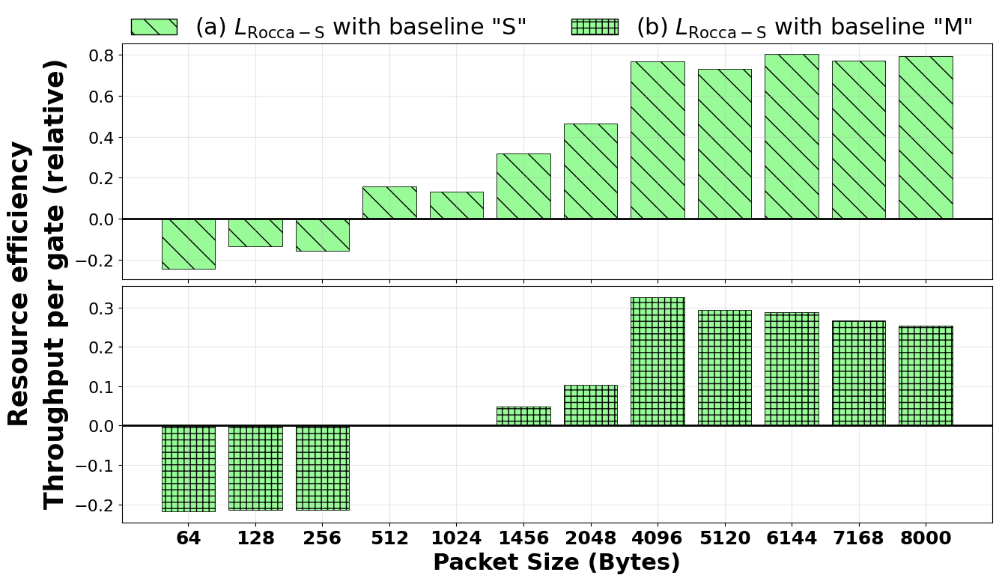

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Data
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

y1 = [-0.2430671848, -0.1346482278, -0.1557476312, 0.1559065212, 0.1331657995,
      0.3182505896, 0.4646907591, 0.7666525283, 0.7309012073, 0.8033669517,
      0.7701734233, 0.7935243089]

y2 = [-0.2184852757, -0.2144687586, -0.2145570899, 0, 0,
      0.04761039567, 0.1030956984, 0.3261473357, 0.2935968399, 0.286909314,
      0.2676107315, 0.2537176384]

# Common design
color = 'palegreen'
hatch_pattern_1 = '\\'
hatch_pattern_2 = '++'

# Create subplots (stacked)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True, gridspec_kw={'hspace': 0.03})

# --- Top subplot ---
bars1 = ax1.bar(range(len(packet_sizes)), y1,
                color=color,
                hatch=hatch_pattern_1,
                edgecolor='black',
                linewidth=0.6)
ax1.axhline(y=0, color='black', linewidth=2)
ax1.tick_params(axis='y', labelsize=16)
ax1.grid(True, alpha=0.3)

# --- Bottom subplot ---
bars2 = ax2.bar(range(len(packet_sizes)), y2,
                color=color,
                hatch=hatch_pattern_2,
                edgecolor='black',
                linewidth=0.6)
ax2.axhline(y=0, color='black', linewidth=2)
ax2.set_xlabel('Packet Size (Bytes)', fontsize=22, fontweight='bold', color='black')
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
ax2.grid(True, alpha=0.3)

# Shared X-ticks
ax2.set_xticks(range(len(packet_sizes)))
ax2.set_xticklabels(packet_sizes, fontsize=18, fontweight='bold')

# --- Shared Y-label (centered, multi-line) ---
fig.text(0.07, 0.5,
         'Resource efficiency\nThroughput per gate (relative)',
         va='center', ha='center', rotation='vertical',
         fontsize=25, fontweight='bold', color='black', linespacing=1.5)

# --- Title-like legend at the top with 2 hatch designs ---
# legend_patches = [
#     Patch(facecolor=color, hatch=hatch_pattern_1, edgecolor='black', label='(a) L_Rocca-S with baseline "S"'),
#     Patch(facecolor=color, hatch=hatch_pattern_2, edgecolor='black', label='(b) L_Rocca-S with baseline "M" ')
# ]
legend_patches = [
    Patch(facecolor=color, hatch=hatch_pattern_1, edgecolor='black',
          label=r'(a) $L_{\mathrm{Rocca-S}}$ with baseline "S"'),
    Patch(facecolor=color, hatch=hatch_pattern_2, edgecolor='black',
          label=r'(b) $L_{\mathrm{Rocca-S}}$ with baseline "M"')
]

fig.legend(handles=legend_patches,
           loc='upper center',
           bbox_to_anchor=(0.56, 0.98),
           fontsize=22,
           ncol=2,
           frameon=False)

# Layout tweaks
plt.tight_layout()
plt.subplots_adjust(left=0.15, right=0.98, top=0.9, bottom=0.1, hspace=0.04)

# Save + show
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/roccaS_baseline_6x_1x_6x_3x.png", dpi=300)
plt.show()


Reupdate on new graph with edgecolor only

/tmp/ipykernel_952539/38613771.py:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


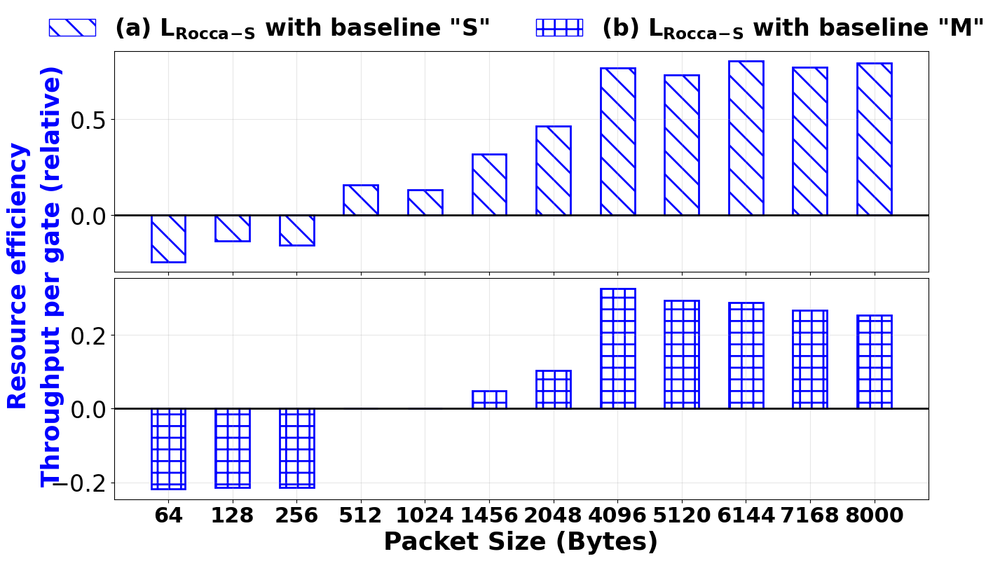

In [45]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2

# Data
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

y1 = [-0.2430671848, -0.1346482278, -0.1557476312, 0.1559065212, 0.1331657995,
      0.3182505896, 0.4646907591, 0.7666525283, 0.7309012073, 0.8033669517,
      0.7701734233, 0.7935243089]

y2 = [-0.2184852757, -0.2144687586, -0.2145570899, 0, 0,
      0.04761039567, 0.1030956984, 0.3261473357, 0.2935968399, 0.286909314,
      0.2676107315, 0.2537176384]

# Common design
color = 'palegreen'
hatch_pattern_1 = '\\'
hatch_pattern_2 = '+'
x = np.arange(len(packet_sizes)) * 1.5   # ← increase spacing factor


# Create subplots (stacked)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True, gridspec_kw={'hspace': 0.03})

# --- Top subplot ---
bars1 = ax1.bar(x, y1,
                color=color,
                hatch=hatch_pattern_1,
            #     edgecolor="#064d83",
                  edgecolor="blue",
                linewidth=2, 
                fill = False)
ax1.axhline(y=0, color='black', linewidth=2)
ax1.tick_params(axis='y', labelsize=24)
ax1.grid(True, alpha=0.3)

# --- Bottom subplot ---
bars2 = ax2.bar(x, y2,
                color=color,
                hatch=hatch_pattern_2,
            #     edgecolor="#064d83",
                edgecolor="blue",
                linewidth=2, 
                fill = False)
ax2.axhline(y=0, color='black', linewidth=2)
ax2.set_xlabel('Packet Size (Bytes)', fontsize=26, fontweight='bold', color="black")
ax2.tick_params(axis='x', labelsize=24)
ax2.tick_params(axis='y', labelsize=24)
ax2.grid(True, alpha=0.3)

# Shared X-ticks
ax2.set_xticks(x)
ax2.set_xticklabels(packet_sizes, fontsize=22, fontweight='bold')

# --- Shared Y-label (centered, multi-line) ---
fig.text(0.07, 0.5,
         'Resource efficiency\nThroughput per gate (relative)',
         va='center', ha='center', rotation='vertical',color = "blue",
         fontsize=25, fontweight='bold', linespacing=1.5)



# --- Title-like legend at the top with 2 hatch designs ---
# legend_patches = [
#     Patch(facecolor=color, hatch=hatch_pattern_1, edgecolor='black', label='(a) L_Rocca-S with baseline "S"'),
#     Patch(facecolor=color, hatch=hatch_pattern_2, edgecolor='black', label='(b) L_Rocca-S with baseline "M" ')
# ]
# legend_patches = [
#     Patch(facecolor=color,fill=False, hatch=hatch_pattern_1, edgecolor="blue",
#           label=r'(a) $L_{\mathrm{Rocca-S}}$ with baseline "S"'),
#     Patch(facecolor=color,fill = False, hatch=hatch_pattern_2, edgecolor="blue",
#           label=r'(b) $L_{\mathrm{Rocca-S}}$ with baseline "M"')
# ]
legend_patches = [
    Patch(
        facecolor=color,
        fill=False,
        hatch=hatch_pattern_1,
        edgecolor="blue",
        label=r'(a) $\mathbf{L}_{\mathbf{Rocca\!-\!S}}$ with baseline "S"'
    ),
    Patch(
        facecolor=color,
        fill=False,
        hatch=hatch_pattern_2,
        edgecolor="blue",
        label=r'(b) $\mathbf{L}_{\mathbf{Rocca\!-\!S}}$ with baseline "M"'
    )
]

# fig.legend(handles=legend_patches,
#            loc='upper center',
#            bbox_to_anchor=(0.56, 0.98),
#            fontsize=22,
#            ncol=2,
#            frameon=False)

fig.legend(
    handles=legend_patches,
    loc='upper center',
    bbox_to_anchor=(0.56, 1),
    ncol=2,
    frameon=False,
    prop={'size': 24, 'weight': 'bold'}  # ✅ bold text
)

# Layout tweaks
plt.tight_layout()
plt.subplots_adjust(left=0.15, right=0.98, top=0.9, bottom=0.1, hspace=0.04)

# Save + show
# plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/roccaS_baseline_6x_1x_6x_3x_update.pdf", dpi=300)
plt.savefig(
    "/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/roccaS_baseline_6x_1x_6x_3x_update.pdf",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


Royal blue

/tmp/ipykernel_255847/3512424910.py:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


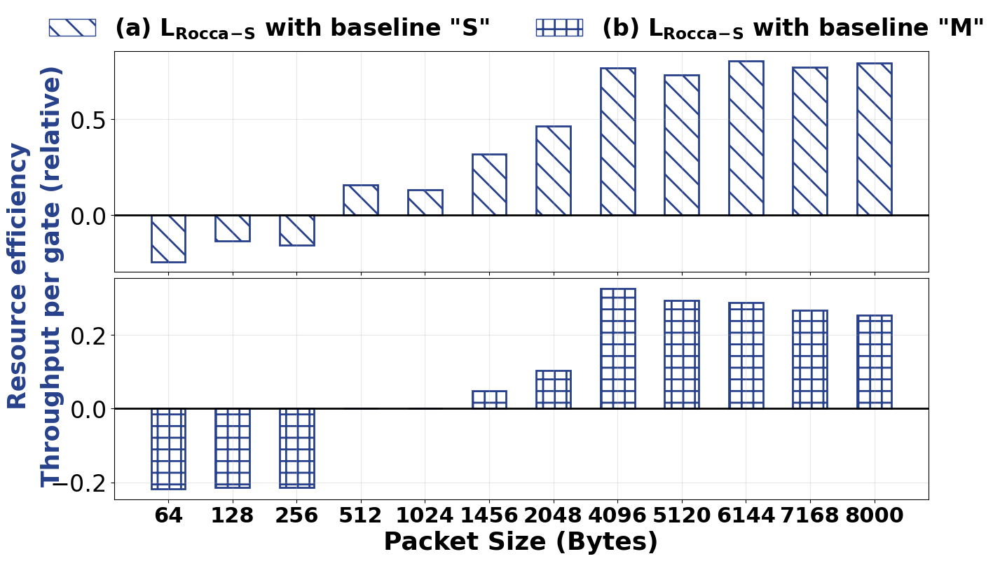

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2

# Data
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

y1 = [-0.2430671848, -0.1346482278, -0.1557476312, 0.1559065212, 0.1331657995,
      0.3182505896, 0.4646907591, 0.7666525283, 0.7309012073, 0.8033669517,
      0.7701734233, 0.7935243089]

y2 = [-0.2184852757, -0.2144687586, -0.2145570899, 0, 0,
      0.04761039567, 0.1030956984, 0.3261473357, 0.2935968399, 0.286909314,
      0.2676107315, 0.2537176384]

# Common design
color = 'palegreen'
hatch_pattern_1 = '\\'
hatch_pattern_2 = '+'
x = np.arange(len(packet_sizes)) * 1.5   # ← increase spacing factor


# Create subplots (stacked)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 8), sharex=True, gridspec_kw={'hspace': 0.03})

# --- Top subplot ---
bars1 = ax1.bar(x, y1,
                color=color,
                hatch=hatch_pattern_1,
            #     edgecolor="#064d83",
                  edgecolor= "#27408B",
                linewidth=2, 
                fill = False)
ax1.axhline(y=0, color='black', linewidth=2)
ax1.tick_params(axis='y', labelsize=24)
ax1.grid(True, alpha=0.3)

# --- Bottom subplot ---
bars2 = ax2.bar(x, y2,
                color=color,
                hatch=hatch_pattern_2,
            #     edgecolor="#064d83",
                edgecolor= "#27408B",
                linewidth=2, 
                fill = False)
ax2.axhline(y=0, color='black', linewidth=2)
ax2.set_xlabel('Packet Size (Bytes)', fontsize=26, fontweight='bold', color="black")
ax2.tick_params(axis='x', labelsize=24)
ax2.tick_params(axis='y', labelsize=24)
ax2.grid(True, alpha=0.3)

# Shared X-ticks
ax2.set_xticks(x)
ax2.set_xticklabels(packet_sizes, fontsize=22, fontweight='bold')

# --- Shared Y-label (centered, multi-line) ---
fig.text(0.07, 0.5,
         'Resource efficiency\nThroughput per gate (relative)',
         va='center', ha='center', rotation='vertical',color =  "#27408B",
         fontsize=25, fontweight='bold', linespacing=1.5)



# --- Title-like legend at the top with 2 hatch designs ---
# legend_patches = [
#     Patch(facecolor=color, hatch=hatch_pattern_1, edgecolor='black', label='(a) L_Rocca-S with baseline "S"'),
#     Patch(facecolor=color, hatch=hatch_pattern_2, edgecolor='black', label='(b) L_Rocca-S with baseline "M" ')
# ]
# legend_patches = [
#     Patch(facecolor=color,fill=False, hatch=hatch_pattern_1, edgecolor= "#27408B",
#           label=r'(a) $L_{\mathrm{Rocca-S}}$ with baseline "S"'),
#     Patch(facecolor=color,fill = False, hatch=hatch_pattern_2, edgecolor= "#27408B",
#           label=r'(b) $L_{\mathrm{Rocca-S}}$ with baseline "M"')
# ]
legend_patches = [
    Patch(
        facecolor=color,
        fill=False,
        hatch=hatch_pattern_1,
        edgecolor= "#27408B",
        label=r'(a) $\mathbf{L}_{\mathbf{Rocca\!-\!S}}$ with baseline "S"'
    ),
    Patch(
        facecolor=color,
        fill=False,
        hatch=hatch_pattern_2,
        edgecolor= "#27408B",
        label=r'(b) $\mathbf{L}_{\mathbf{Rocca\!-\!S}}$ with baseline "M"'
    )
]

# fig.legend(handles=legend_patches,
#            loc='upper center',
#            bbox_to_anchor=(0.56, 0.98),
#            fontsize=22,
#            ncol=2,
#            frameon=False)

fig.legend(
    handles=legend_patches,
    loc='upper center',
    bbox_to_anchor=(0.56, 1),
    ncol=2,
    frameon=False,
    prop={'size': 24, 'weight': 'bold'}  # ✅ bold text
)

# Layout tweaks
plt.tight_layout()
plt.subplots_adjust(left=0.15, right=0.98, top=0.9, bottom=0.1, hspace=0.04)

# Save + show
# plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/roccaS_baseline_6x_1x_6x_3x_update.pdf", dpi=300)
plt.savefig(
    "/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/roccaS_baseline_6x_1x_6x_3x_update.pdf",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


/tmp/ipykernel_337169/1529164032.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


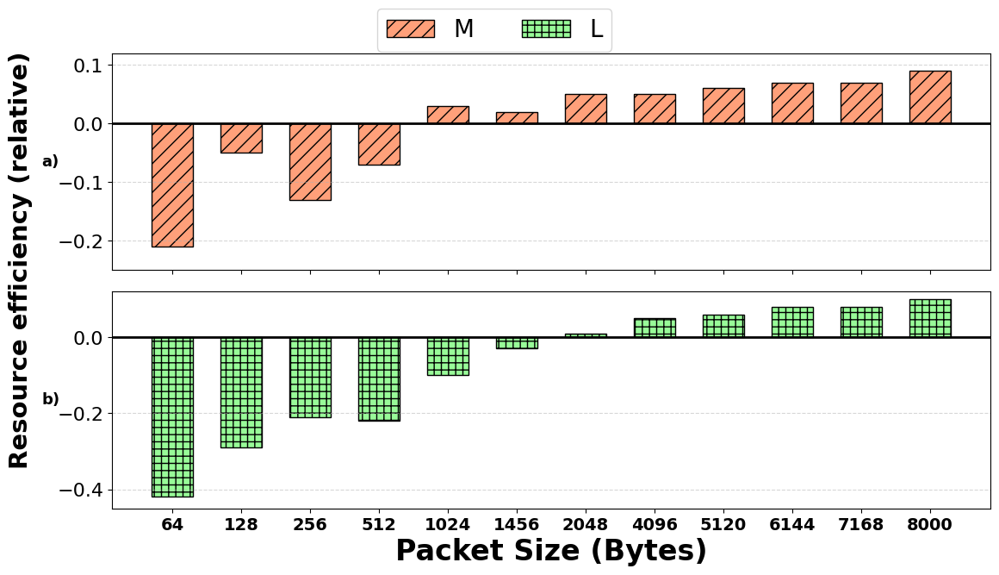

In [21]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Original packet sizes
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]
M_values = [-0.21, -0.05, -0.13, -0.07, 0.03, 0.02, 0.05, 0.05, 0.06, 0.07, 0.07, 0.09]
L_values = [-0.42, -0.29, -0.21, -0.22, -0.10, -0.03, 0.01, 0.05, 0.06, 0.08, 0.08, 0.10]

# Use equally spaced x positions
x = np.arange(len(packet_sizes))
bar_width = 0.6  # Adjust width relative to spacing

# Bar colors and hatches
colors = ['lightsalmon', 'palegreen']
hatches = ['//', '++']

# Create figure and subplots
# fig, axs = plt.subplots(2, 1, figsize=(8, 6), sharex=True, sharey=True, gridspec_kw={'hspace': 0.1})
fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True, sharey=False, gridspec_kw={'hspace': 0.1})


# Subplot a) for M
axs[0].bar(x, M_values, width=bar_width, color=colors[0], edgecolor='black', hatch=hatches[0])

# Subplot b) for L
axs[1].bar(x, L_values, width=bar_width, color=colors[1], edgecolor='black', hatch=hatches[1])

# Add bold horizontal line at y=0 for both subplots
for ax in axs:
    ax.axhline(y=0, color='black', linewidth=2, linestyle='-')

# X-axis settings
axs[1].set_xlabel("Packet Size (Bytes)", fontsize=24, fontweight='bold')
axs[1].set_xticks(x)
axs[1].set_xticklabels(packet_sizes, rotation=0, fontsize=15, fontweight='bold')

# Y-axis ticks and labels
for ax in axs:
    ax.tick_params(axis='both', labelsize=14)
    ax.tick_params(axis='y', labelsize=16)  # Make y-axis labels larger
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Set different y-axis limits for each subplot
axs[0].set_ylim(-0.25, 0.12)  # Upper graph - limited range
axs[1].set_ylim(-0.45, 0.12)  # Lower graph - full range

# Add subplot labels 'a)' and 'b)' on the left
axs[0].text(-0.07, 0.5, 'a)', transform=axs[0].transAxes,
            fontsize=13, fontweight='bold', color='black', va='center', ha='center')
axs[1].text(-0.07, 0.5, 'b)', transform=axs[1].transAxes,
            fontsize=13, fontweight='bold', color='black', va='center', ha='center')

# Add a single common y-axis label
fig.text(0.03, 0.59, 'Resource efficiency (relative)', va='center', rotation='vertical',
         fontsize=21, fontweight='bold', color='black')

# Add legend
custom_handles = [
    Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0], label='M'),
    Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1], label='L')
]
fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.10), ncol=2, fontsize=20)

# Layout adjustments
plt.tight_layout()
plt.subplots_adjust(left=0.13, right=0.98, top=0.99)
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/relative_power_efficiency_aes_2.png", dpi=300, bbox_inches='tight')
plt.show()

Color Coding Update

/tmp/ipykernel_952539/401408067.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


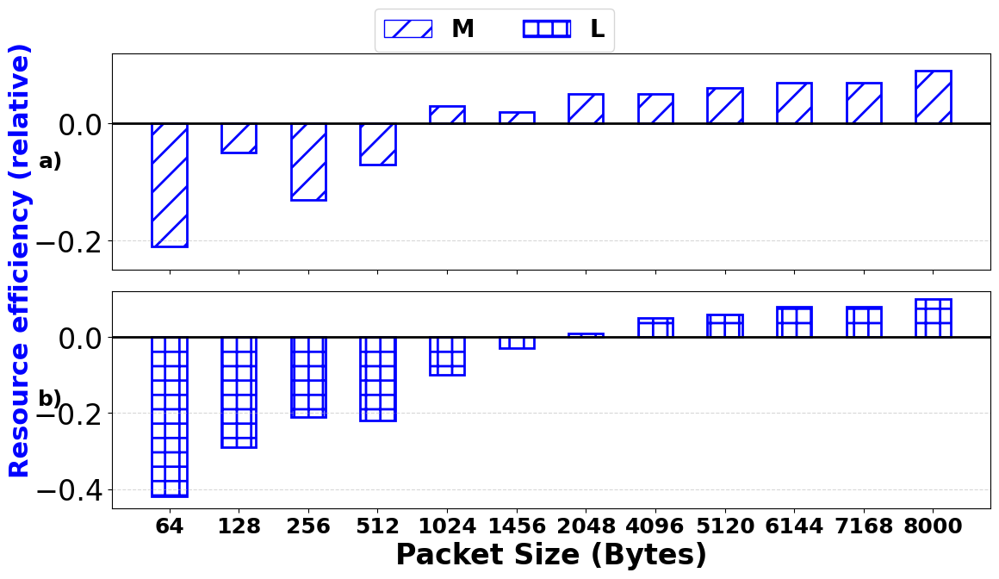

In [27]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2

# Original packet sizes
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]
M_values = [-0.21, -0.05, -0.13, -0.07, 0.03, 0.02, 0.05, 0.05, 0.06, 0.07, 0.07, 0.09]
L_values = [-0.42, -0.29, -0.21, -0.22, -0.10, -0.03, 0.01, 0.05, 0.06, 0.08, 0.08, 0.10]

# Use equally spaced x positions
spacing= 1.2
x = np.arange(len(packet_sizes)) * 1.2
bar_width = 0.6  # Adjust width relative to spacing

# Bar colors and hatches
colors = ['lightsalmon', 'palegreen']
hatches = ['/', '+']

# Create figure and subplots
# fig, axs = plt.subplots(2, 1, figsize=(8, 6), sharex=True, sharey=True, gridspec_kw={'hspace': 0.1})
fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True, sharey=False, gridspec_kw={'hspace': 0.1})


# Subplot a) for M
axs[0].bar(x, M_values, width=bar_width, color=colors[0], edgecolor='blue', hatch=hatches[0], fill=False, linewidth=2)

# Subplot b) for L
axs[1].bar(x, L_values, width=bar_width, color=colors[1], edgecolor='blue', hatch=hatches[1], fill=False,linewidth=2)

# Add bold horizontal line at y=0 for both subplots
for ax in axs:
    ax.axhline(y=0, color='black', linewidth=2, linestyle='-')

# X-axis settings
axs[1].set_xlabel("Packet Size (Bytes)", fontsize=24, fontweight='bold')
axs[1].set_xticks(x)
axs[1].set_xticklabels(packet_sizes, rotation=0, fontsize=30, fontweight='bold')
axs[1].tick_params(axis='x', labelsize=18)

for label in axs[1].get_xticklabels():
    label.set_fontweight('bold')

# Y-axis ticks and labels
for ax in axs:
    # ax.tick_params(axis='both', labelsize=14)
    ax.tick_params(axis='y', labelsize=24)  # Make y-axis labels larger
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Set different y-axis limits for each subplot
axs[0].set_ylim(-0.25, 0.12)  # Upper graph - limited range
axs[1].set_ylim(-0.45, 0.12)  # Lower graph - full range

# Add subplot labels 'a)' and 'b)' on the left
axs[0].text(-0.07, 0.5, 'a)', transform=axs[0].transAxes,
            fontsize=18, fontweight='bold', color='black', va='center', ha='center')
axs[1].text(-0.07, 0.5, 'b)', transform=axs[1].transAxes,
            fontsize=18, fontweight='bold', color='black', va='center', ha='center')

# Add a single common y-axis label
fig.text(0.03, 0.59, 'Resource efficiency (relative)', va='center', rotation='vertical',
         fontsize=22, fontweight='bold', color='blue')

# Add legend
custom_handles = [
    Patch(facecolor=colors[0], edgecolor='blue', hatch=hatches[0], label='M', fill=False),
    Patch(facecolor=colors[1], edgecolor='blue', hatch=hatches[1], label='L', fill = False)
]
fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.10), ncol=2, fontsize=20, prop={'size': 20, 'weight': 'bold'},)

# Layout adjustments
plt.tight_layout()
plt.subplots_adjust(left=0.13, right=0.98, top=0.99)
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/relative_power_efficiency_aes_2_update.pdf", dpi=300, bbox_inches='tight')
plt.show()

Royal Blue

/tmp/ipykernel_255847/2191551392.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


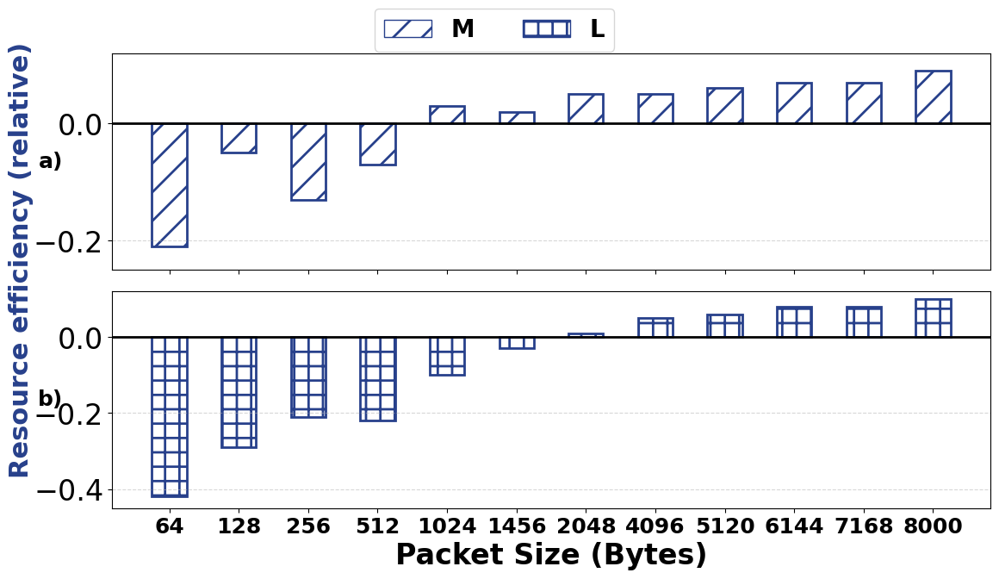

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 2

# Original packet sizes
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]
M_values = [-0.21, -0.05, -0.13, -0.07, 0.03, 0.02, 0.05, 0.05, 0.06, 0.07, 0.07, 0.09]
L_values = [-0.42, -0.29, -0.21, -0.22, -0.10, -0.03, 0.01, 0.05, 0.06, 0.08, 0.08, 0.10]

# Use equally spaced x positions
spacing= 1.2
x = np.arange(len(packet_sizes)) * 1.2
bar_width = 0.6  # Adjust width relative to spacing

# Bar colors and hatches
colors = ['lightsalmon', 'palegreen']
hatches = ['/', '+']

# Create figure and subplots
# fig, axs = plt.subplots(2, 1, figsize=(8, 6), sharex=True, sharey=True, gridspec_kw={'hspace': 0.1})
fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True, sharey=False, gridspec_kw={'hspace': 0.1})


# Subplot a) for M
axs[0].bar(x, M_values, width=bar_width, color=colors[0], edgecolor="#27408B", hatch=hatches[0], fill=False, linewidth=2)

# Subplot b) for L
axs[1].bar(x, L_values, width=bar_width, color=colors[1], edgecolor="#27408B", hatch=hatches[1], fill=False,linewidth=2)

# Add bold horizontal line at y=0 for both subplots
for ax in axs:
    ax.axhline(y=0, color='black', linewidth=2, linestyle='-')

# X-axis settings
axs[1].set_xlabel("Packet Size (Bytes)", fontsize=24, fontweight='bold')
axs[1].set_xticks(x)
axs[1].set_xticklabels(packet_sizes, rotation=0, fontsize=30, fontweight='bold')
axs[1].tick_params(axis='x', labelsize=18)

for label in axs[1].get_xticklabels():
    label.set_fontweight('bold')

# Y-axis ticks and labels
for ax in axs:
    # ax.tick_params(axis='both', labelsize=14)
    ax.tick_params(axis='y', labelsize=24)  # Make y-axis labels larger
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Set different y-axis limits for each subplot
axs[0].set_ylim(-0.25, 0.12)  # Upper graph - limited range
axs[1].set_ylim(-0.45, 0.12)  # Lower graph - full range

# Add subplot labels 'a)' and 'b)' on the left
axs[0].text(-0.07, 0.5, 'a)', transform=axs[0].transAxes,
            fontsize=18, fontweight='bold', color='black', va='center', ha='center')
axs[1].text(-0.07, 0.5, 'b)', transform=axs[1].transAxes,
            fontsize=18, fontweight='bold', color='black', va='center', ha='center')

# Add a single common y-axis label
fig.text(0.03, 0.59, 'Resource efficiency (relative)', va='center', rotation='vertical',
         fontsize=22, fontweight='bold', color="#27408B")

# Add legend
custom_handles = [
    Patch(facecolor=colors[0], edgecolor="#27408B", hatch=hatches[0], label='M', fill=False),
    Patch(facecolor=colors[1], edgecolor="#27408B", hatch=hatches[1], label='L', fill = False)
]
fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.10), ncol=2, fontsize=20, prop={'size': 20, 'weight': 'bold'},)

# Layout adjustments
plt.tight_layout()
plt.subplots_adjust(left=0.13, right=0.98, top=0.99)
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/relative_power_efficiency_aes_2_update.pdf", dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_3915366/3672996400.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


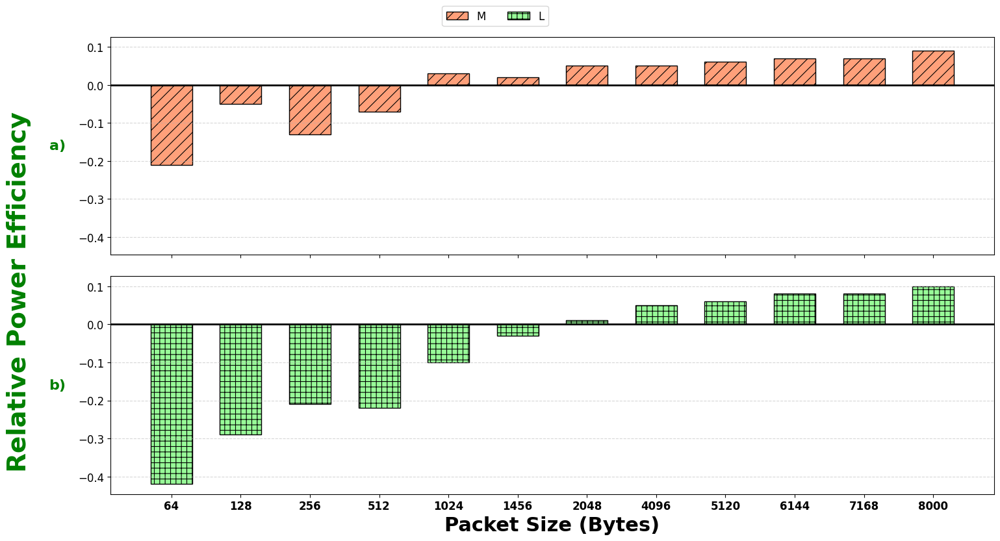

In [113]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Original packet sizes
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]
M_values = [-0.21, -0.05, -0.13, -0.07, 0.03, 0.02, 0.05, 0.05, 0.06, 0.07, 0.07, 0.09]
L_values = [-0.42, -0.29, -0.21, -0.22, -0.10, -0.03, 0.01, 0.05, 0.06, 0.08, 0.08, 0.10]

# Use equally spaced x positions
x = np.arange(len(packet_sizes))
bar_width = 0.6  # Adjust width relative to spacing

# Bar colors and hatches
colors = ['lightsalmon', 'palegreen']
hatches = ['//', '++']

# Create figure and subplots
fig, axs = plt.subplots(2, 1, figsize=(16, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0.1})

# Subplot a) for M
axs[0].bar(x, M_values, width=bar_width, color=colors[0], edgecolor='black', hatch=hatches[0])

# Subplot b) for L
axs[1].bar(x, L_values, width=bar_width, color=colors[1], edgecolor='black', hatch=hatches[1])

# Add bold horizontal line at y=0 for both subplots
for ax in axs:
    ax.axhline(y=0, color='black', linewidth=2, linestyle='-')

# X-axis settings
axs[1].set_xlabel("Packet Size (Bytes)", fontsize=22, fontweight='bold')
axs[1].set_xticks(x)
axs[1].set_xticklabels(packet_sizes, rotation=0, fontsize=10, fontweight='bold')

# Y-axis ticks and labels
for ax in axs:
    ax.tick_params(axis='both', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)  # Make y-axis labels larger
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# Add subplot labels 'a)' and 'b)' on the left
axs[0].text(-0.06, 0.5, 'a)', transform=axs[0].transAxes,
            fontsize=16, fontweight='bold', color='green', va='center', ha='center')
axs[1].text(-0.06, 0.5, 'b)', transform=axs[1].transAxes,
            fontsize=16, fontweight='bold', color='green', va='center', ha='center')

# Add a single common y-axis label
fig.text(0.03, 0.5, 'Relative Power Efficiency', va='center', rotation='vertical',
         fontsize=28, fontweight='bold', color='green')

# Add legend
custom_handles = [
    Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0], label='M'),
    Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1], label='L')
]
fig.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, 1.06), ncol=2, fontsize=12)

# Layout adjustments
plt.tight_layout()
plt.subplots_adjust(left=0.13, right=0.98, top=0.99)
plt.show()

Agamdeep's Rocca's Plots

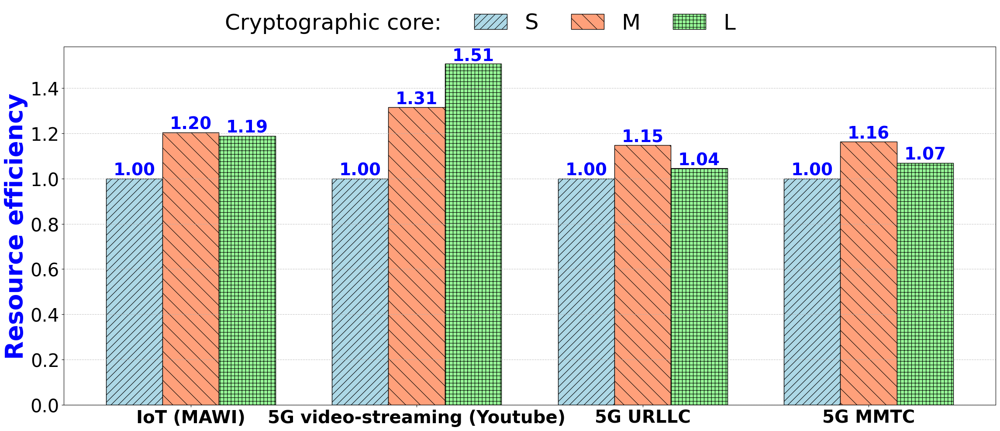

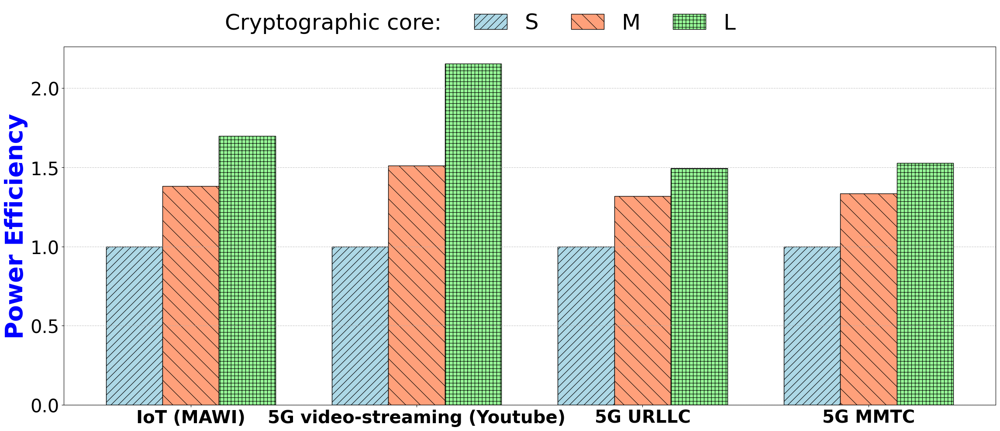

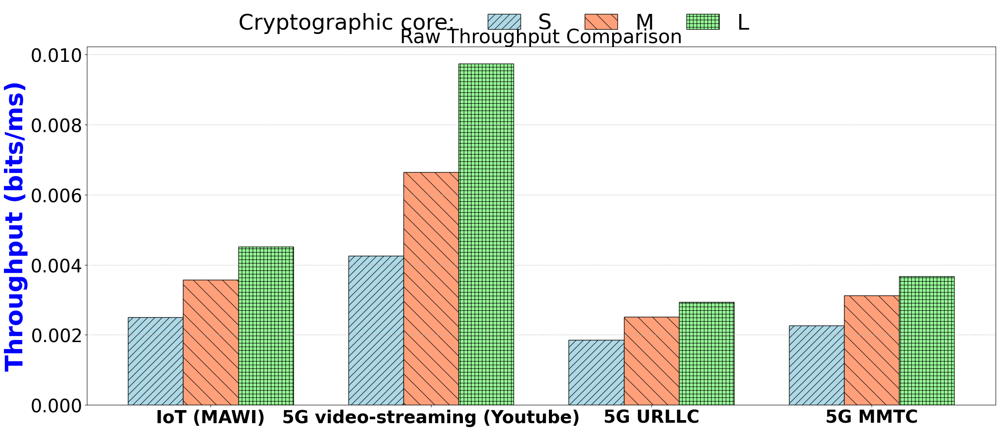

Plots saved to: updated_csvs/crypto_efficiency_plots


In [ ]:
import glob
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.patches import Patch


# ----- 1. Core‑specific gate‑equivalent and power numbers -----
core_info = {
    '1_0': {'GE': 203760.00, 'Power': 4.381},
    '3_1': {'GE': 241710.00, 'Power': 4.526},
    '6_2': {'GE': 309284.00, 'Power': 4.654}
}

# ----- 2. Visual style (taken from the original script) -----
# colors  = ['#F4C7AB', '#BFD8B8', '#D7CFE4']  # pastel palette
# hatches = ['//', '\\', 'xx']
colors = ['lightblue', 'lightsalmon', 'palegreen']
hatches = ['//', '\\', '++']                # distinctive hatch per bar
labels = ['S','M','L']

plt.rcParams['hatch.linewidth'] = 0.8         # subtle hatch density


# ----- 3. Paths -----
CSV_FOLDER   = 'updated_csvs'
OUTPUT_DIR   = os.path.join(CSV_FOLDER, 'crypto_efficiency_plots')
os.makedirs(OUTPUT_DIR, exist_ok=True)


# ----- 4. Helper to aggregate numbers from every CSV -----
def collect_all_metrics():
    """Return 3 nested dicts keyed by  filename ➜ core ➜ metric."""
    resource_eff, power_eff, throughputs = {}, {}, {}

    csv_files  = glob.glob(os.path.join(CSV_FOLDER, '*.csv'))
    filenames  = [os.path.splitext(os.path.basename(f))[0] for f in csv_files]

    for path, name in zip(csv_files, filenames):
        df          = pd.read_csv(path)

        first_rows = pd.read_csv(path, nrows=2)
        lengths_col = None  # default column name for lengths
        for c in ["Length (Bytes)", "Length (bytes)", "Length"]:
            if c in first_rows.columns:
                lengths_col = c
                break

        total_bits  = df[lengths_col].sum() * 8 # Calculation of the throughput

        res, pwr, thr = {}, {}, {}

        for core, spec in core_info.items():
            if core not in df.columns:
                continue          # skip if core column absent

            total_latency      = df[core].sum()          # ms
            throughput_bits_ms = total_bits / total_latency

            thr[core] = throughput_bits_ms
            res[core] = throughput_bits_ms / spec['GE']
            pwr[core] = throughput_bits_ms / spec['Power']

        # ----- normalise efficiencies to the baseline (core 1_0 = 1) -----
        baseline_res = res['1_0']
        baseline_pwr = pwr['1_0']

        resource_eff[name] = {k: v / baseline_res for k, v in res.items()}
        power_eff[name]    = {k: v / baseline_pwr for k, v in pwr.items()}
        throughputs[name]  = thr

        # resource_eff[name] = {k: v for k, v in res.items()}
        # power_eff[name]    = {k: v for k, v in pwr.items()}
        # throughputs[name]  = thr

    return filenames, resource_eff, power_eff, throughputs
    # return filenames, res, pwr, thr


# ----- 5. Plotting helper -----
def make_grouped_bar(data_dict, filenames, title, ylabel, out_name, annotate=False):
    bar_width     = 0.25
    core_labels   = list(core_info.keys())
    indices       = np.arange(len(filenames))

    plt.figure(figsize=(23, 10))

    x_labels = ['IoT (MAWI)', '5G video-streaming (Youtube)', '5G URLLC', '5G MMTC']
    legends = ['Cryptographic Core:','S', 'M', 'L']

    for i, core in enumerate(core_labels):
        vals = [data_dict[file][core] for file in filenames]
        bars = plt.bar(
            indices + i * bar_width,
            vals,
            bar_width,
            color=colors[i],
            edgecolor='black',
            linewidth=1,
            hatch=hatches[i],
            label=core,
        )
        if annotate:
            for bar in bars:
                height = bar.get_height()
                plt.text(
                    bar.get_x() + bar.get_width() / 2,
                    height,
                    f'{height:.2f}',
                    ha='center',
                    va='bottom',
                    fontsize=28,
                    rotation=0,
                    color = 'blue',
                    fontweight='bold'

                )

    # plt.xlabel('5G Datasets',fontsize=20,fontweight='bold')
    # plt.ylabel(ylabel, fontsize=40, fontweight='bold', color='blue')
    plt.title(title,fontsize=32)
    plt.xticks(indices + bar_width * (len(core_labels) - 1) / 2,
               x_labels, ha='center', fontsize=29, fontweight='bold')

    legend_elems = [
        Rectangle((0, 0), 1, 1, facecolor=colors[i],
                  edgecolor='black', linewidth=1, alpha=0.8, hatch=hatches[i])
        for i in range(len(labels))
    ]
    # plt.legend(legend_elems, labels, title='Core')
    # plt.legend(
    # legend_elems,
    # labels,
    # title='cryptographic core',
    # fontsize=16,          # size of the legend labels
    # title_fontsize=16     # size of the legend title
    # )
    legend_labels = ['Cryptographic core:', 'S', 'M', 'L']
    legend_handles = [
        Patch(facecolor='white', edgecolor='white'),  # blank patch for label
        Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0]),
        Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1]),
        Patch(facecolor=colors[2], edgecolor='black', hatch=hatches[2]),
    ]

    plt.legend(
        legend_handles,
        legend_labels,
        loc='lower center',
        bbox_to_anchor=(0.42, 1.0),
        ncol=4,
        frameon=False,
        fontsize=36,
        handlelength=1.5,
        columnspacing=1.5,
        borderaxespad=0.2,
    )

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tick_params(axis='y', labelsize=30)
    plt.ylabel(ylabel, fontsize=40, fontweight='bold', color='blue')
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(OUTPUT_DIR, out_name), dpi=300)
    plt.close()


# ----- 6. Main -----
if __name__ == '__main__':
    fnames, res_eff, pwr_eff, thr = collect_all_metrics()

    make_grouped_bar(res_eff, fnames,
                    #  'Resource Efficiency',
                        None,
                     'Resource efficiency',
                     'normalized_resource_eff.png',
                     annotate=True)

    make_grouped_bar(pwr_eff, fnames,
                    #  'Power Efficiency',
                     None,
                     'Power Efficiency',
                     'normalized_power_eff.png')

    make_grouped_bar(thr, fnames,
                     'Raw Throughput Comparison',
                     'Throughput (bits/ms)',
                     'throughput.png')

    print('Plots saved to:', OUTPUT_DIR)


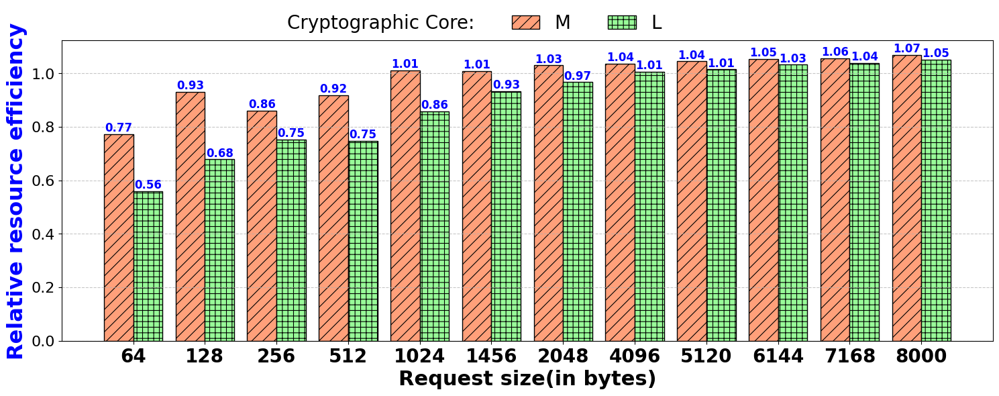

In [206]:
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

throughput_1x = [568.99, 756.55, 1107.92, 1434.89, 1688.88, 1770.28, 1803.76, 1870.70, 1918.17, 1951.84, 1971.11, 1995.14]

throughput_2x = [439.54, 703.72, 952.87, 1318.03, 1707.76, 1785.33, 1857.44, 1938.58, 2003.55, 2057.66, 2081.22, 2133.38]

throughput_4x = [318.23, 513.16, 833.40, 1071.96, 1448.80, 1651.96, 1744.64, 1881.28, 1946.62, 2015.83, 2046.46, 2098.38]


# relative_throughput_1x_1x = []
# for th_1x, th_1x  in zip(throughput_1x, throughput_1x):
#     relative_throughput_1x_1x.append(th_1x/th_1x)

relative_throughput_1x_2x = []
for th_1x, th_2x  in zip(throughput_1x, throughput_2x):
    relative_throughput_1x_2x.append(th_2x/th_1x)

relative_throughput_1x_4x = []
for th_1x, th_4x  in zip(throughput_1x, throughput_4x):
    relative_throughput_1x_4x.append(th_4x/th_1x)


# Organize into data_dict
data_dict = {
    str(size): {'M': relative_throughput_1x_2x[i], 'L': relative_throughput_1x_4x[i]}
    for i, size in enumerate(packet_sizes)
}

# Visual configuration
colors = ['lightsalmon', 'palegreen']
hatches = ['//', '++']
core_info = {'M': None, 'L': None}
labels = ['M', 'L']

# Plotting function
def make_grouped_bar(data_dict, filenames, title, ylabel,xlabel,  annotate=False):
    bar_width = 0.45
    core_labels = list(core_info.keys())
    group_spacing = 1.1  # Add spacing between groups
    indices = np.arange(len(filenames)) * group_spacing  # Spaced indices

    plt.figure(figsize=(15, 6))
    legends = ['Cryptographic Core:', 'M', 'L']

    for i, core in enumerate(core_labels):
        vals = [data_dict[file][core] for file in filenames]
        bars = plt.bar(
            indices + i  * bar_width,
            vals,
            bar_width,
            color=colors[i],
            edgecolor='black',
            linewidth=1,
            hatch=hatches[i],
            label=core,
        )
        if annotate:
            for bar in bars:
                height = bar.get_height()
                plt.text(
                    bar.get_x() + bar.get_width() / 2,
                    height,
                    f'{height:.2f}',
                    ha='center',
                    va='bottom',
                    fontsize=12,
                    color='blue',
                    fontweight='bold'
                )

    plt.ylabel(ylabel, fontsize=23, fontweight='bold', color='blue')
    plt.xlabel(xlabel, fontsize=22, fontweight='bold', color='black')
    # plt.ylabel(ylabel, fontsize=22, fontweight='bold', color='blue')
    plt.title(title, fontsize=18, fontweight='bold')
    plt.tick_params(axis='y', labelsize=16)
    plt.xticks(indices + bar_width / 2, filenames, ha='center', fontsize=20, fontweight='bold', rotation=0)

    legend_handles = [
        Patch(facecolor='white', edgecolor='white'),
        Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0]),
        Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1]),
    ]

    plt.legend(
        legend_handles,
        legends,
        loc='lower center',
        bbox_to_anchor=(0.42, 0.97),
        ncol=3,
        frameon=False,
        fontsize=20,
        handlelength=1.5
    )

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    # plt.tick_params(axis='both', labelsize=16)
    plt.tight_layout()
    plt.show()

# Call function
make_grouped_bar(
    data_dict=data_dict,
    filenames=[str(p) for p in packet_sizes],
    # title='Relative Throughput: 2x and 4x vs 1x',
    title = None,
    ylabel='Relative resource efficiency',
    xlabel = 'Request size(in bytes)',
    annotate=True
)




Rocca-S baseline to 1x and 3x



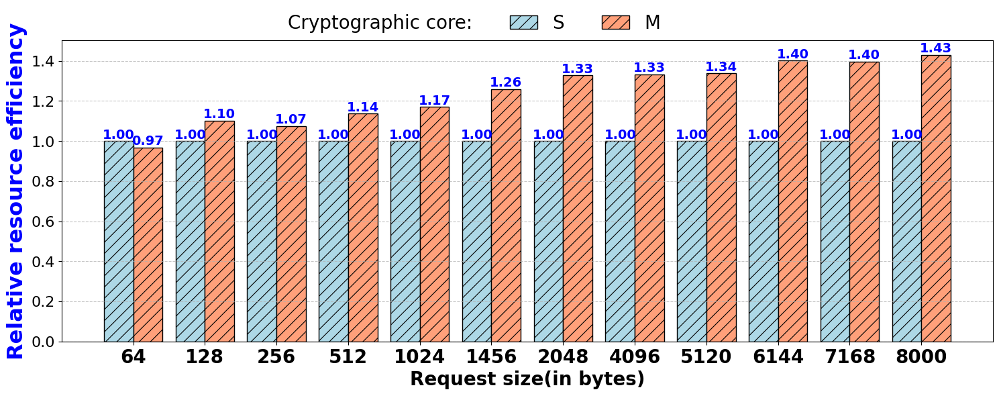

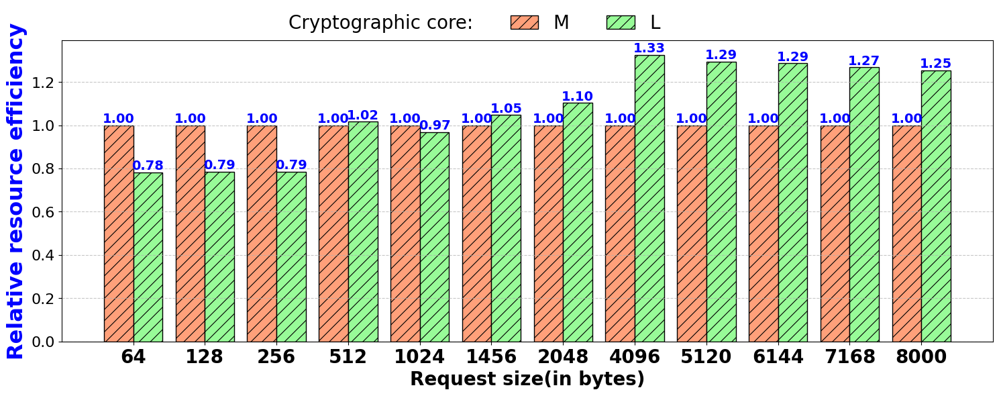

In [204]:
packet_sizes = [64, 128, 256, 512, 1024, 1456, 2048, 4096, 5120, 6144, 7168, 8000]

throughput_1x = [1.08565119, 1.966159929, 3.941954806, 6.263755469, 10.32401603, 11.71859601, 13.52800058, 16.91871751, 18.36227232, 18.80646391, 19.73977073, 20.03016165]

throughput_3x = [1.051502916, 2.1659482, 4.237105765, 7.122571197, 12.08641614, 14.74598397, 17.96248274, 22.53859301, 24.56969462, 26.35380375, 27.56588964, 28.65444398]

throughput_6x = [0.8217650118, 1.701419979, 3.328004682, 7.240315794, 11.69882188, 15.44804611, 19.81433744, 29.88949507, 31.78327932, 33.9149555, 34.94281753, 35.92458184]


relative_throughput_1x_1x = []
for th_1x, th_1x  in zip(throughput_1x, throughput_1x):
    relative_throughput_1x_1x.append(th_1x/th_1x)

# 1x as a basline
relative_throughput_1x_3x = []
for th_1x, th_3x  in zip(throughput_1x, throughput_3x):
    relative_throughput_1x_3x.append(th_3x/th_1x)


# 3x as a baseline
relative_throughput_3x_6x = []
for th_3x, th_6x  in zip(throughput_3x, throughput_6x):
    relative_throughput_3x_6x.append(th_6x/th_3x)


# Organize into data_dict
data_dict_1 = {
    str(size): {'S': relative_throughput_1x_1x[i], 'M': relative_throughput_1x_3x[i]}
    for i, size in enumerate(packet_sizes)
}

data_dict_2 = {
    str(size): {'M': relative_throughput_1x_1x[i], 'L': relative_throughput_3x_6x[i]}
    for i, size in enumerate(packet_sizes)
}

# Visual configuration
colors_1 = ['lightblue', 'lightsalmon']
hatches_1 = ['//', '//']
core_info_1 = {'S': None, 'M': None}
labels_1 = ['S', 'M']

colors_2 = ['lightsalmon', 'palegreen']
hatches_2 = ['//', '//']                # distinctive hatch per bar
core_info_2 = {'M': None, 'L': None}
labels_2 = ['M','L']

legends_1 = ['Cryptographic core:', 'S', 'M']
legends_2 = ['Cryptographic core:', 'M', 'L']



# Plotting function
def make_grouped_bar(data_dict, filenames, title, ylabel, xlabel, colors, hatches, core_info, labels,legends, annotate=False):
    bar_width = 0.45
    core_labels = list(core_info.keys())
    group_spacing = 1.1  # Add spacing between groups
    indices = np.arange(len(filenames)) * group_spacing  # Spaced indices

    plt.figure(figsize=(15, 6))
    # legends = ['Cryptographic Core:', '2x', '4x']

    for i, core in enumerate(core_labels):
        vals = [data_dict[file][core] for file in filenames]
        bars = plt.bar(
            indices + i  * bar_width,
            vals,
            bar_width,
            color=colors[i],
            edgecolor='black',
            linewidth=1,
            hatch=hatches[i],
            label=core,
        )
        if annotate:
            for bar in bars:
                height = bar.get_height()
                plt.text(
                    bar.get_x() + bar.get_width() / 2,
                    height,
                    f'{height:.2f}',
                    ha='center',
                    va='bottom',
                    fontsize=14,
                    color='blue',
                    fontweight='bold'
                )

    plt.ylabel(ylabel, fontsize=23, fontweight='bold', color='blue')
    plt.xlabel(xlabel, fontsize=20, fontweight='bold', color='black')
    # plt.ylabel(ylabel, fontsize=22, fontweight='bold', color='blue')
    plt.title(title, fontsize=22, fontweight='bold')
    plt.tick_params(axis='both', labelsize=16)
    plt.xticks(indices + bar_width / 2, filenames, ha='center', fontsize=20, fontweight='bold', rotation=0)

    legend_handles = [
        Patch(facecolor='white', edgecolor='white'),
        Patch(facecolor=colors[0], edgecolor='black', hatch=hatches[0]),
        Patch(facecolor=colors[1], edgecolor='black', hatch=hatches[1]),
    ]

    plt.legend(
        legend_handles,
        legends,
        loc='lower center',
        bbox_to_anchor=(0.42, 0.97),
        ncol=3,
        frameon=False,
        fontsize=20,
        handlelength=1.5
    )

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tick_params(axis='y', labelsize=16)
    plt.tight_layout()
    plt.show()

# Call function
make_grouped_bar(
    data_dict=data_dict_1,
    filenames=[str(p) for p in packet_sizes],
    # title='Relative Throughput: 2x and 4x vs 1x',
    title = None,
    ylabel='Relative resource efficiency',
    xlabel = 'Request size(in bytes)',
    colors = colors_1,
    hatches = hatches_1,
    core_info=core_info_1,
    labels = labels_1,
    legends = legends_1,
    annotate=True
)
make_grouped_bar(
    data_dict=data_dict_2,
    filenames=[str(p) for p in packet_sizes],
    # title='Relative Throughput: 2x and 4x vs 1x',
    title = None,
    ylabel='Relative resource efficiency',
    xlabel = 'Request size(in bytes)',
    colors = colors_2,
    hatches = hatches_2,
    core_info=core_info_2,
    labels = labels_2,
    legends=legends_2,
    annotate=True
)






Choice of FlexMesh’s scheduling policy on MMTC (M,L)

In [1]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
import numpy as np
core_files = {
    '3x_6x_rr': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '3x_6x_c': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_rocca_1x_6x/order_queue_classifier_rocca_11_14.csv',
    '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/amp_load_balancer/output.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/amp_load_balancer/output.csv',
    '3x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc_Dataset_updated_12G/rocca_3x_6x/amp_load_balancer/output_1ms.csv'
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        
        ge_key = core_config[:5]
        if ge_key in core_ge:
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000 # milli-seconds
    return df[['processing_delay']]  # Return only the relevant column

def out_of_order_percentage(arrival_order, processing_order):
    arrival_index = {packet: i for i, packet in enumerate(arrival_order)}
    out_of_order_count = 0
    max_seen_index = -1 
    for packet in processing_order:
        if arrival_index[packet] < max_seen_index:
            out_of_order_count += 1
        max_seen_index = max(max_seen_index, arrival_index[packet])
    total_packets = len(arrival_order)
    return (out_of_order_count / total_packets) * 100


def process_packets(flow_dict, algo):
    avg_out_of_order = 0
    valid_flows_ooo, total_flows = 0, 0
    ooo_list = []



    for flow_id, packets in flow_dict.items():
        # Checking the processing order and arrival order of particular flow id.
        processing_order = [p[2] for p in packets]
        arrival_order = sorted([p[2] for p in packets])
        # Calculate out of order percentage of that particular flow id.
        out_of_order = out_of_order_percentage(arrival_order, processing_order)

        # if out_of_order < 0:
            # f.write(f"Warning: Negative out_of_order {out_of_order} for algo {algo}\n")

        if len(processing_order) >= 2:
            ooo_list.append(out_of_order)
            avg_out_of_order += out_of_order
            valid_flows_ooo += 1

        total_flows += 1

    if valid_flows_ooo > 0:
        overall_avg_out_of_order = avg_out_of_order / valid_flows_ooo
    else:
        overall_avg_out_of_order = None

    return ooo_list

def ooo_metric(order_queue, algo):
    
    flow_dict = {}
    for packet in order_queue:
        flow_id = packet[3]
        if flow_id not in flow_dict:
            flow_dict[flow_id] = []
        flow_dict[flow_id].append(packet)

    ooo_list = process_packets(flow_dict, algo)
    ooo_np = np.array(ooo_list)
    min_val = np.min(ooo_np)
    max_val = np.max(ooo_np)
    mean_val = np.mean(ooo_np)
    median_val = np.median(ooo_np)
        # f.write(f"  Min    : {min_val:.4f}\n")
        # f.write(f"  Mean   : {mean_val:.4f}\n")
        # f.write(f"  Median : {median_val:.4f}\n")
        # f.write(f"  Max    : {max_val:.4f}\n")
        # f.write("==================================================\n")
    
    return ooo_list


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    # config_to_label = {
    #     '(s,S)': r'$\mathbf(S,S)$',
    #     '(M,M)': r'$\mathbf(M,M)$',
    #     '(L,L)' : r'$\mathbf(L,L)$',
    #     '(S,L)' : r'$\mathbf(S,L)$',
    #     '(M,L)' : r'$\mathbf(M,L)$',
    # }

        # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
        '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
        '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
        '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
    }
        
        
    # Initialize data containers
    latency_data = []
    ooo_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df =  pd.read_csv(file_path)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

            # Convert the order queue to a list of packets
            order_queue = df.values.tolist()  # Convert DataFrame to list of lists

            # Give the order queue list to the function to calculate out of order percentage.
            ooo_list = ooo_metric(order_queue, algo)

            df3 = pd.DataFrame(ooo_list, columns=['Out of Order Percentage'])
            df3['core_type'] = core_config  # Add core type column
            ooo_data.append(df3)  # Append to list

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    print(combined_df)

    combined_ooo_df = pd.concat(ooo_data, ignore_index=True)
    print(combined_ooo_df)


{'3x_6x_rr': 10.18895854314376, '3x_6x_c': 7.279582897977065, '3x_6x_cs': 10.77607305688807, '3x_6x_amp': 10.415201642784288}
Core Config : 3x_6x_rr
Core Config : 3x_6x_c
Core Config : 3x_6x_cs
Core Config : 3x_6x_amp
         processing_delay  core_type
0                0.001923   3x_6x_rr
1                0.001938   3x_6x_rr
2                0.001923   3x_6x_rr
3                0.002367   3x_6x_rr
4                0.002059   3x_6x_rr
...                   ...        ...
6399995       1000.151178  3x_6x_amp
6399996       1000.153054  3x_6x_amp
6399997       1000.151116  3x_6x_amp
6399998       1000.152976  3x_6x_amp
6399999       1000.152053  3x_6x_amp

[6400000 rows x 2 columns]
        Out of Order Percentage  core_type
0                           0.0   3x_6x_rr
1                           0.0   3x_6x_rr
2                           0.0   3x_6x_rr
3                           0.0   3x_6x_rr
4                           0.0   3x_6x_rr
...                         ...        ...
127995   

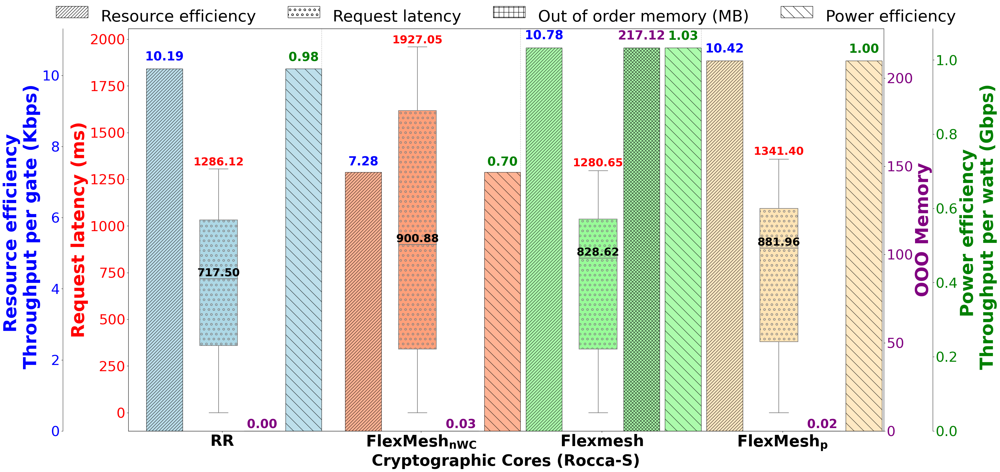

In [22]:

# import matplotlib.pyplot as plt
# import numpy as np

# # Prepare data
# core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

# # label_map = {
# #     '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
# #     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
# #     '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
# #     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
# # }

# label_map = {
#     '3x_6x_rr': r'$\mathbf{RR}$',
#     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}}$',
#     '3x_6x_cs': r'$\mathbf{Flexmesh}$',
#     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}}$'
# }

# # Increase spacing between groups - much wider spacing
# x = np.array([0, 2, 4, 6]) # Consistent spacing of 2 units
# bar_width = 0.4  # Slightly wider bars
# latency_offset = 0.05

# # colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
# colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
# hatches = ['///', '\\', '---', '\\\///', '+++']

# fig, ax1 = plt.subplots(figsize=(30, 14))  # Wider figure to accommodate spacing

# # # Right Y-axis for Throughput per Watt
# # ax2 = ax1.twinx()

# # # Second right Y-axis for Latency
# # ax3 = ax1.twinx()


# # ax3.spines["right"].set_position(("outward", 60))

# # Right Y-axis for Request Latency (closer to the plot)
# # ax3 = ax1.twinx()

# # ax4 = ax1.twinx()

# # # Left Y-axis for Throughput per GE
# # # ax4.spines["left"].set_position(("outward", 60))  # Push left Y-axis outward

# # # Second right Y-axis for Throughput per Watt (push it outward)
# # ax2 = ax1.twinx()
# # ax2.spines["right"].set_position(("outward", 60))

# # Updated Code

# # === Left Y-axis 2 (closer to the plot) ===
# ax_left2 = ax1
# # ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# # === Left Y-axis 1 (further out) ===
# ax_left1 = ax1.twinx()
# ax_left1.spines["left"].set_position(("outward", 100))
# ax_left1.yaxis.set_label_position("left")
# ax_left1.yaxis.set_ticks_position("left")
# # ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# # Hide ax_left1's right spine (twinx adds it by default)
# ax_left1.spines["right"].set_visible(False)

# # === Right Y-axis 1 ===
# ax_right1 = ax1.twinx()
# # ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# # === Right Y-axis 2 ===
# ax_right2 = ax1.twinx()
# ax_right2.spines["right"].set_position(("outward", 70))
# # ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')





# # Bar plot: Throughput per GE (left position - more spacing)
# bars_ge = []
# for i, core in enumerate(core_types):
#     val = throughput_ge_dict[core]
#     bar = ax_left1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
#                   color=colors[i], hatch=hatches[0], edgecolor='black',
#                   alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
#     bars_ge.append(bar)
#     ax_left1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
#              ha='center', va='bottom', fontsize=30, fontweight='bold', color='blue')

# # Bar plot: Throughput per Watt (right position - more spacing)
# bars_watt = []
# for i, core in enumerate(core_types):
#     val = throughput_watt_dict[core]
#     bar = ax_right2.bar(x[i] + bar_width*2.52, throughput_watt_dict[core], width=bar_width,
#                   color=colors[i], hatch=hatches[1], edgecolor='black',
#                   alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
#     bars_watt.append(bar)
#     ax_right2.text(x[i] + bar_width*2.52, val + 0.014 * val, f'{val:.1f}', 
#              ha='center', va='bottom', fontsize=30, fontweight='bold', color='green')

# # Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# latency_offset = 0.2
# box_latency = ax_left2.boxplot(latency_data, 
#                 #   positions= x,
#                   positions=x,
#                   widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# # Box plot: Latency (center position)
# ooo_data = [combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage'] for core in core_types]
# ooo_offset = bar_width * 1.19
# box_ooo = ax_right1.boxplot(ooo_data, 
#                 #   positions=x, 
#                   positions=[pos + ooo_offset for pos in x],
#                   widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='+', color='purple', alpha=0.6, markersize=4))

# # Custom boxplot colors/hatch
# for i, patch in enumerate(box_latency['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)

# for i, patch in enumerate(box_ooo['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('+')   
#     patch.set_alpha(1.0)            

# # Annotate Median and P99 for latency values.
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=25, fontweight='bold', color='black')
#         ax_left2.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=22, color='red', fontweight='bold')
        
# # Annotate Median and P99 for OOO values.
# for i, core in enumerate(core_types):
#     ooo_vals = combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage']
#     if len(ooo_vals) > 0:
        


#         median = ooo_vals.median()
#         p99 = np.percentile(ooo_vals, 99)
        
#         # Set offset so P99 is slightly above median if they overlap (both are zero or close)
#         if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
#             p99_y = median + 6  # small upward nudge
#         else:
#             p99_y = p99 + 0.09 * p99  # proportional upward offset

        
#         xpos = x[i] + ooo_offset # Center position for latency annotations

#         ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=24, fontweight='bold', color='black')
#         ax_right1.text(xpos, p99_y, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=22, color='purple', fontweight='bold')

# for xpos in x[:-1]:
#     ax1.axvline(x=xpos + 1.2, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# # Axis Labels
# ax_left1.set_ylabel('Resource efficiency \n Throughput per gate (Kbps)', fontsize=34, fontweight='bold', color='blue')
# ax_left2.set_ylabel('Request latency (sec)', fontsize=34, fontweight='bold', color='red')
# ax_right1.set_ylabel('per-flow OOO %', fontsize=34, fontweight='bold', color='purple')
# ax_right2.set_ylabel('Power efficiency \n Throughput per watt (Gbps)', fontsize=34, fontweight='bold', color='green')

# ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# # Color-coded ticks
# ax_left1.tick_params(axis='y', labelcolor='blue')
# ax_left2.tick_params(axis='y', labelcolor='red')
# ax_right1.tick_params(axis='y', labelcolor='purple')
# ax_right2.tick_params(axis='y', labelcolor='green')

# # ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# # X-axis with better spacing
# ax_left1.set_xticks(x)
# ax_left1.set_xticklabels([label_map[c] for c in core_types])

# plt.setp(ax1.get_xticklabels(), fontsize=30, fontweight='bold')

# ax_left1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


# class CenteredHandler(HandlerPatch):
#     def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
#         center = mpatches.Rectangle(
#             (xdescent, ydescent+height/3), width, height + 0.5 ,
#             facecolor=orig_handle.get_facecolor(),
#             edgecolor=orig_handle.get_edgecolor(),
#             hatch=orig_handle.get_hatch(),
#             transform=trans
#         )
#         return [center]


# legend_elements = [
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='+', label='Out of order percentage'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
# ]

# # Add legend
# # ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
# #            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.082),
#            ncol=4, fontsize=32, frameon=False)

# ax_left1.tick_params(axis='y', labelsize=24)
# ax_left2.tick_params(axis='y', labelsize=24)
# ax_right1.tick_params(axis='y', labelsize=24)
# ax_right2.tick_params(axis='y', labelsize=24)


# # Remove title and all grids as requested
# # plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# ax_left1.set_xlim(x[0] - bar_width * 2.6, x[-1] + bar_width * 3.2)

# # ax_left1.set_ylim(0, 85.0)  # Resource efficiency
# # ax_left2.set_ylim(0, 2.0)  # Request latency
# # ax_right1.set_ylim(0, 2.0)  # Power efficiency
# # ax

# ax_left1.grid(False)
# ax_left2.grid(False)
# ax_right1.grid(False)
# ax_right2.grid(False)

# # Remove legend as requested
# # legend_labels = [f"{label_map[c]}" for c in core_types]
# # custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# # ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# # Set x-axis limits to show all data clearly
# # ax1.set_xlim(-1, 8)

# # Layout
# plt.tight_layout()
# plt.show()

import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

ooo_memory = {
    '3x_6x_rr': 3180,
    '3x_6x_c': 26072,
    '3x_6x_cs': 217122072.0,
    '3x_6x_amp': 15580,
}

# label_map = {
#     '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
#     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
#     '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
#     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
# }

label_map = {
    '3x_6x_rr': r'$\mathbf{RR}$',
    '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}}$',
    '3x_6x_cs': r'$\mathbf{Flexmesh}$',
    '3x_6x_amp': r'$\mathbf{FlexMesh_{p}}$'
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 11, 21, 31]) # Consistent spacing of 3 units
bar_width = 2  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(34, 16))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
# ax3 = ax1.twinx()

# ax4 = ax1.twinx()

# # Left Y-axis for Throughput per GE
# # ax4.spines["left"].set_position(("outward", 60))  # Push left Y-axis outward

# # Second right Y-axis for Throughput per Watt (push it outward)
# ax2 = ax1.twinx()
# ax2.spines["right"].set_position(("outward", 60))

# Updated Code

# === Left Y-axis 2 (closer to the plot) ===
ax_left2 = ax1
# ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# === Left Y-axis 1 (further out) ===
ax_left1 = ax1.twinx()
ax_left1.spines["left"].set_position(("outward", 160))
ax_left1.yaxis.set_label_position("left")
ax_left1.yaxis.set_ticks_position("left")
# ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# Hide ax_left1's right spine (twinx adds it by default)
ax_left1.spines["right"].set_visible(False)

# === Right Y-axis 1 ===
ax_right1 = ax1.twinx()
# ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# === Right Y-axis 2 ===
ax_right2 = ax1.twinx()
ax_right2.spines["right"].set_position(("outward", 120))
# ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')





# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax_left1.bar(x[i] - bar_width*1.6, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax_left1.text(x[i] - bar_width*1.6, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax_right2.bar(x[i] + bar_width +2.5, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax_right2.text(x[i] + bar_width +2.5, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='green')

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
latency_offset = 0.2
box_latency = ax_left2.boxplot(latency_data, 
                #   positions= x,
                  positions=[pos - latency_offset for pos in x],
                  widths=bar_width * 1.05,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Box plot: OOO  (center position)
# ooo_data = [combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage'] for core in core_types]
ooo_offset = bar_width 
# box_ooo = ax_right1.boxplot(ooo_data, 
#                 #   positions=x, 
#                   positions=[pos + ooo_offset for pos in x],
#                   widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='+', color='purple', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box_latency['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('o')   
    patch.set_alpha(1.0)

# for i, patch in enumerate(box_ooo['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('+')   
#     patch.set_alpha(1.0)            

# Annotate Median and P99 for latency values.
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i] - latency_offset # Center position for latency annotations
        ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=27, fontweight='bold', color='black')
        ax_left2.text(xpos, p99 + 0.02 * p99, f'{p99:.2f}', ha='center', va='bottom',
                 fontsize=27, color='red', fontweight='bold')
        
# Plot ooo memory bar plots on ax_right1
for i, core in enumerate(core_types):
    mem_val = ooo_memory[core] / 1e6  # Convert bytes to Megabytes
    # Give same pattern as ooo box plot
    
    bar = ax_right1.bar(x[i] + ooo_offset +0.2, mem_val, width=bar_width ,
                  color=colors[i], hatch='xxx', edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - OOO Memory")
    ax_right1.text(x[i] + ooo_offset +0.2, mem_val + 0.015 * mem_val, f'{mem_val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='purple')
# # Annotate Median and P99 for OOO values.
# for i, core in enumerate(core_types):

#     ooo_vals = combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage']
#     if len(ooo_vals) > 0:
        
#         if core == '1x_6x_cs':
#             median = ooo_vals.median()
#             p99 = np.percentile(ooo_vals, 99)
            
#             # Set offset so P99 is slightly above median if they overlap (both are zero or close)
#             if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
#                 p99_y = median + 4  # small upward nudge
#             else:
#                 p99_y = p99 + 1 * p99  # proportional upward offset

            
#             xpos = x[i] + ooo_offset # Center position for latency annotations

#             ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                     fontsize=26, fontweight='bold', color='black')
#             ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
#                     fontsize=25, color='purple', fontweight='bold')
#         else:

#             median = ooo_vals.median()
#             p99 = np.percentile(ooo_vals, 99)
            
#             # Set offset so P99 is slightly above median if they overlap (both are zero or close)
#             if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
#                 p99_y = median + 4  # small upward nudge
#             else:
#                 p99_y = p99 + 0.08 * p99  # proportional upward offset

            
#             xpos = x[i] + ooo_offset # Center position for latency annotations

#             ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                     fontsize=27, fontweight='bold', color='black')
#             ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
#                     fontsize=27, color='purple', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 5.5, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax_left1.set_ylabel('Resource efficiency \n Throughput per gate (Kbps)', fontsize=44, fontweight='bold', color='blue')
ax_left2.set_ylabel('Request latency (ms)', fontsize=44, fontweight='bold', color='red')
ax_right1.set_ylabel('OOO Memory', fontsize=44, fontweight='bold', color='purple')
ax_right2.set_ylabel('Power efficiency \n Throughput per watt (Gbps)', fontsize=44, fontweight='bold', color='green')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 38,fontweight='bold')

# Color-coded ticks
ax_left1.tick_params(axis='y', labelcolor='blue')
ax_left2.tick_params(axis='y', labelcolor='red')
ax_right1.tick_params(axis='y', labelcolor='purple')
ax_right2.tick_params(axis='y', labelcolor='green')

# ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# X-axis with better spacing
ax_left1.set_xticks(x)
ax_left1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=38, fontweight='bold')

ax_left1.set_xlim(x[0] - bar_width * 1.5, x[-1] + bar_width * 1.5)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='+', label='Out of order memory (MB)'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.084),
           ncol=4, fontsize=39, frameon=False)

ax_left1.tick_params(axis='y', labelsize=34)
ax_left2.tick_params(axis='y', labelsize=34)
ax_right1.tick_params(axis='y', labelsize=34)
ax_right2.tick_params(axis='y', labelsize=34)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax_left1.set_xlim(x[0] - bar_width * 2.6, x[-1] + bar_width * 2.8)

# ax_left1.set_ylim(0, 85.0)  # Resource efficiency
# ax_left2.set_ylim(0, 2.0)  # Request latency
# ax_right1.set_ylim(0, 2.0)  # Power efficiency
# ax

ax_left1.grid(False)
ax_left2.grid(False)
ax_right1.grid(False)
ax_right2.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 8)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/MMTC_RR_FlexMesh_vs_FlexMesh_p_3x_6x.png", dpi=300)
plt.tight_layout()
plt.show()

Mixed_datset Workload Throughput : 7 Gbps

In [129]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
import numpy as np
core_files = {
    '3x_6x_rr': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_3x_6x/round_robin_rocca_3x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '3x_6x_c': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_3x_6x/classifier_rocca_3x_6x/order_queue_classifier_rocca_11_14.csv',
    '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_3x_6x/classifier_scheduler_rocca_3x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/amp_load_balancer/output.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/amp_load_balancer/output.csv',
    '3x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_3x_6x/amp_load_balancer_3x_6x/output_500_user_request_length_1ms.csv'
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        
        ge_key = core_config[:5]
        if ge_key in core_ge:
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000 # milli-seconds
    return df[['processing_delay']]  # Return only the relevant column

def out_of_order_percentage(arrival_order, processing_order):
    arrival_index = {packet: i for i, packet in enumerate(arrival_order)}
    out_of_order_count = 0
    max_seen_index = -1 
    for packet in processing_order:
        if arrival_index[packet] < max_seen_index:
            out_of_order_count += 1
        max_seen_index = max(max_seen_index, arrival_index[packet])
    total_packets = len(arrival_order)
    return (out_of_order_count / total_packets) * 100


def process_packets(flow_dict, algo):
    avg_out_of_order = 0
    valid_flows_ooo, total_flows = 0, 0
    ooo_list = []



    for flow_id, packets in flow_dict.items():
        # Checking the processing order and arrival order of particular flow id.
        processing_order = [p[2] for p in packets]
        arrival_order = sorted([p[2] for p in packets])
        # Calculate out of order percentage of that particular flow id.
        out_of_order = out_of_order_percentage(arrival_order, processing_order)

        # if out_of_order < 0:
            # f.write(f"Warning: Negative out_of_order {out_of_order} for algo {algo}\n")

        if len(processing_order) >= 2:
            ooo_list.append(out_of_order)
            avg_out_of_order += out_of_order
            valid_flows_ooo += 1

        total_flows += 1

    if valid_flows_ooo > 0:
        overall_avg_out_of_order = avg_out_of_order / valid_flows_ooo
    else:
        overall_avg_out_of_order = None

    return ooo_list

def ooo_metric(order_queue, algo):
    
    flow_dict = {}
    for packet in order_queue:
        flow_id = packet[3]
        if flow_id not in flow_dict:
            flow_dict[flow_id] = []
        flow_dict[flow_id].append(packet)

    ooo_list = process_packets(flow_dict, algo)
    ooo_np = np.array(ooo_list)
    min_val = np.min(ooo_np)
    max_val = np.max(ooo_np)
    mean_val = np.mean(ooo_np)
    median_val = np.median(ooo_np)
        # f.write(f"  Min    : {min_val:.4f}\n")
        # f.write(f"  Mean   : {mean_val:.4f}\n")
        # f.write(f"  Median : {median_val:.4f}\n")
        # f.write(f"  Max    : {max_val:.4f}\n")
        # f.write("==================================================\n")
    
    return ooo_list


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    # config_to_label = {
    #     '(s,S)': r'$\mathbf(S,S)$',
    #     '(M,M)': r'$\mathbf(M,M)$',
    #     '(L,L)' : r'$\mathbf(L,L)$',
    #     '(S,L)' : r'$\mathbf(S,L)$',
    #     '(M,L)' : r'$\mathbf(M,L)$',
    # }

        # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
        '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
        '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
        '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
    }
        
        
    # Initialize data containers
    latency_data = []
    ooo_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df =  pd.read_csv(file_path)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

            # Convert the order queue to a list of packets
            order_queue = df.values.tolist()  # Convert DataFrame to list of lists

            # Give the order queue list to the function to calculate out of order percentage.
            ooo_list = ooo_metric(order_queue, algo)

            df3 = pd.DataFrame(ooo_list, columns=['Out of Order Percentage'])
            df3['core_type'] = core_config  # Add core type column
            ooo_data.append(df3)  # Append to list

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    print(combined_df)

    combined_ooo_df = pd.concat(ooo_data, ignore_index=True)
    print(combined_ooo_df)


{'3x_6x_rr': 13.350839347895416, '3x_6x_c': 11.68064724081696, '3x_6x_cs': 13.350850724501424, '3x_6x_amp': 13.350850724506234}
Core Config : 3x_6x_rr
Core Config : 3x_6x_c
Core Config : 3x_6x_cs
Core Config : 3x_6x_amp
         processing_delay  core_type
0                0.002378   3x_6x_rr
1                0.003224   3x_6x_rr
2                0.002378   3x_6x_rr
3                0.003224   3x_6x_rr
4                0.002378   3x_6x_rr
...                   ...        ...
1421299          0.001938  3x_6x_amp
1421300          0.002378  3x_6x_amp
1421301          0.001938  3x_6x_amp
1421302          0.002378  3x_6x_amp
1421303          0.002378  3x_6x_amp

[1421304 rows x 2 columns]
      Out of Order Percentage  core_type
0                   13.951345   3x_6x_rr
1                    0.320513   3x_6x_rr
2                    0.320513   3x_6x_rr
3                    0.000000   3x_6x_rr
4                    0.000000   3x_6x_rr
...                       ...        ...
3995                2

Plot the Mixed Dataset (M,L) Cryptographic core

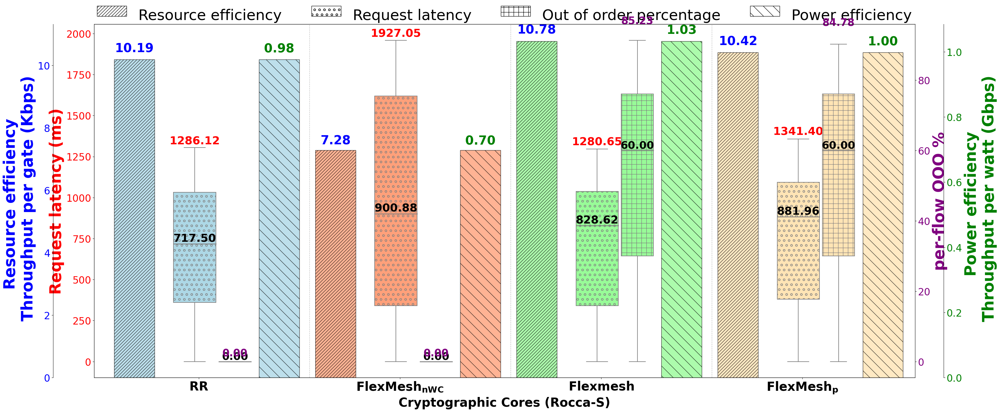

In [19]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Prepare data
# core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

# # label_map = {
# #     '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
# #     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
# #     '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
# #     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
# # }

# label_map = {
#     '3x_6x_rr': r'$\mathbf{RR}$',
#     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}}$',
#     '3x_6x_cs': r'$\mathbf{Flexmesh}$',
#     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}}$'
# }

# # Increase spacing between groups - much wider spacing
# x = np.array([0, 2, 4, 6]) # Consistent spacing of 2 units
# bar_width = 0.4  # Slightly wider bars
# latency_offset = 0.05

# # colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
# colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
# hatches = ['///', '\\', '---', '\\\///', '+++']

# fig, ax1 = plt.subplots(figsize=(30, 14))  # Wider figure to accommodate spacing

# # # Right Y-axis for Throughput per Watt
# # ax2 = ax1.twinx()

# # # Second right Y-axis for Latency
# # ax3 = ax1.twinx()


# # ax3.spines["right"].set_position(("outward", 60))

# # Right Y-axis for Request Latency (closer to the plot)
# # ax3 = ax1.twinx()

# # ax4 = ax1.twinx()

# # # Left Y-axis for Throughput per GE
# # # ax4.spines["left"].set_position(("outward", 60))  # Push left Y-axis outward

# # # Second right Y-axis for Throughput per Watt (push it outward)
# # ax2 = ax1.twinx()
# # ax2.spines["right"].set_position(("outward", 60))

# # Updated Code

# # === Left Y-axis 2 (closer to the plot) ===
# ax_left2 = ax1
# # ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# # === Left Y-axis 1 (further out) ===
# ax_left1 = ax1.twinx()
# ax_left1.spines["left"].set_position(("outward", 100))
# ax_left1.yaxis.set_label_position("left")
# ax_left1.yaxis.set_ticks_position("left")
# # ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# # Hide ax_left1's right spine (twinx adds it by default)
# ax_left1.spines["right"].set_visible(False)

# # === Right Y-axis 1 ===
# ax_right1 = ax1.twinx()
# # ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# # === Right Y-axis 2 ===
# ax_right2 = ax1.twinx()
# ax_right2.spines["right"].set_position(("outward", 70))
# # ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')





# # Bar plot: Throughput per GE (left position - more spacing)
# bars_ge = []
# for i, core in enumerate(core_types):
#     val = throughput_ge_dict[core]
#     bar = ax_left1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
#                   color=colors[i], hatch=hatches[0], edgecolor='black',
#                   alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
#     bars_ge.append(bar)
#     ax_left1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.2f}', 
#              ha='center', va='bottom', fontsize=30, fontweight='bold', color='blue')

# # Bar plot: Throughput per Watt (right position - more spacing)
# bars_watt = []
# for i, core in enumerate(core_types):
#     val = throughput_watt_dict[core]
#     bar = ax_right2.bar(x[i] + bar_width*2.52, throughput_watt_dict[core], width=bar_width,
#                   color=colors[i], hatch=hatches[1], edgecolor='black',
#                   alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
#     bars_watt.append(bar)
#     ax_right2.text(x[i] + bar_width*2.52, val + 0.014 * val, f'{val:.2f}', 
#              ha='center', va='bottom', fontsize=30, fontweight='bold', color='green')

# # Box plot: Latency (center position)
# latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
# latency_offset = 0.2
# box_latency = ax_left2.boxplot(latency_data, 
#                 #   positions= x,
#                   positions=x,
#                   widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# # Box plot: Latency (center position)
# ooo_data = [combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage'] for core in core_types]
# ooo_offset = bar_width * 1.19
# box_ooo = ax_right1.boxplot(ooo_data, 
#                 #   positions=x, 
#                   positions=[pos + ooo_offset for pos in x],
#                   widths=bar_width * 0.8,
#                   patch_artist=True,
#                   boxprops=dict(facecolor='white', color='black', linewidth=1.5),
#                 #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
#                   medianprops=dict(color='grey', linewidth=2),
#                   whiskerprops=dict(color='grey', linewidth=1.5),
#                   capprops=dict(color='grey', linewidth=1.5),
#                   flierprops=dict(marker='+', color='purple', alpha=0.6, markersize=4))

# # Custom boxplot colors/hatch
# for i, patch in enumerate(box_latency['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('o')   
#     patch.set_alpha(1.0)

# for i, patch in enumerate(box_ooo['boxes']):
#     patch.set_edgecolor('grey')  # Set edge color for the box
#     patch.set_facecolor(colors[i])     # No face color fill
#     # patch.set_hatch(hatches[i]) # Hatch pattern on edge
#     patch.set_hatch('+')   
#     patch.set_alpha(1.0)            

# # Annotate Median and P99 for latency values.
# for i, core in enumerate(core_types):
#     lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
#     if len(lat_vals) > 0:
#         median = lat_vals.median()
#         p99 = np.percentile(lat_vals, 99)
#         xpos = x[i]  # Center position for latency annotations
#         ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=25, fontweight='bold', color='black')
#         ax_left2.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=22, color='red', fontweight='bold')
        
# # Annotate Median and P99 for OOO values.
# for i, core in enumerate(core_types):
#     ooo_vals = combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage']
#     if len(ooo_vals) > 0:
        


#         median = ooo_vals.median()
#         p99 = np.percentile(ooo_vals, 99)
        
#         # Set offset so P99 is slightly above median if they overlap (both are zero or close)
#         if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
#             p99_y = median + 6  # small upward nudge
#         else:
#             p99_y = p99 + 0.09 * p99  # proportional upward offset

        
#         xpos = x[i] + ooo_offset # Center position for latency annotations

#         ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
#                  fontsize=24, fontweight='bold', color='black')
#         ax_right1.text(xpos, p99_y, f'P99: {p99:.2f}', ha='center', va='bottom',
#                  fontsize=22, color='purple', fontweight='bold')

# for xpos in x[:-1]:
#     ax1.axvline(x=xpos + 1.2, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# # Axis Labels
# ax_left1.set_ylabel('Resource efficiency \n Throughput per gate (Kbps)', fontsize=34, fontweight='bold', color='blue')
# ax_left2.set_ylabel('Request latency (sec)', fontsize=34, fontweight='bold', color='red')
# ax_right1.set_ylabel('per-flow OOO %', fontsize=34, fontweight='bold', color='purple')
# ax_right2.set_ylabel('Power efficiency \n Throughput per watt (Gbps)', fontsize=34, fontweight='bold', color='green')

# ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# # Color-coded ticks
# ax_left1.tick_params(axis='y', labelcolor='blue')
# ax_left2.tick_params(axis='y', labelcolor='red')
# ax_right1.tick_params(axis='y', labelcolor='purple')
# ax_right2.tick_params(axis='y', labelcolor='green')

# # ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# # X-axis with better spacing
# ax_left1.set_xticks(x)
# ax_left1.set_xticklabels([label_map[c] for c in core_types])

# plt.setp(ax1.get_xticklabels(), fontsize=30, fontweight='bold')

# ax_left1.set_xlim(x[0] - bar_width * 2, x[-1] + bar_width * 2)


# class CenteredHandler(HandlerPatch):
#     def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
#         center = mpatches.Rectangle(
#             (xdescent, ydescent+height/3), width, height + 0.5 ,
#             facecolor=orig_handle.get_facecolor(),
#             edgecolor=orig_handle.get_edgecolor(),
#             hatch=orig_handle.get_hatch(),
#             transform=trans
#         )
#         return [center]


# legend_elements = [
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='+', label='Out of order percentage'),
#     mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
# ]

# # Add legend
# # ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
# #            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
# ax1.legend(handles=legend_elements,
#            handler_map={mpatches.Patch: CenteredHandler()},
#            loc='upper center', bbox_to_anchor=(0.5, 1.082),
#            ncol=4, fontsize=32, frameon=False)

# ax_left1.tick_params(axis='y', labelsize=24)
# ax_left2.tick_params(axis='y', labelsize=24)
# ax_right1.tick_params(axis='y', labelsize=24)
# ax_right2.tick_params(axis='y', labelsize=24)


# # Remove title and all grids as requested
# # plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
# ax_left1.set_xlim(x[0] - bar_width * 2.6, x[-1] + bar_width * 3.2)

# # ax_left1.set_ylim(0, 85.0)  # Resource efficiency
# # ax_left2.set_ylim(0, 2.0)  # Request latency
# # ax_right1.set_ylim(0, 2.0)  # Power efficiency
# # ax

# ax_left1.grid(False)
# ax_left2.grid(False)
# ax_right1.grid(False)
# ax_right2.grid(False)

# # Remove legend as requested
# # legend_labels = [f"{label_map[c]}" for c in core_types]
# # custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# # ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# # Set x-axis limits to show all data clearly
# # ax1.set_xlim(-1, 8)

# # Layout
# plt.tight_layout()
# plt.show()
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

# label_map = {
#     '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
#     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
#     '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
#     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
# }

label_map = {
    '3x_6x_rr': r'$\mathbf{RR}$',
    '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}}$',
    '3x_6x_cs': r'$\mathbf{Flexmesh}$',
    '3x_6x_amp': r'$\mathbf{FlexMesh_{p}}$'
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 10, 20, 30]) # Consistent spacing of 3 units
bar_width = 2  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(34, 14))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
# ax3 = ax1.twinx()

# ax4 = ax1.twinx()

# # Left Y-axis for Throughput per GE
# # ax4.spines["left"].set_position(("outward", 60))  # Push left Y-axis outward

# # Second right Y-axis for Throughput per Watt (push it outward)
# ax2 = ax1.twinx()
# ax2.spines["right"].set_position(("outward", 60))

# Updated Code

# === Left Y-axis 2 (closer to the plot) ===
ax_left2 = ax1
# ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# === Left Y-axis 1 (further out) ===
ax_left1 = ax1.twinx()
ax_left1.spines["left"].set_position(("outward", 100))
ax_left1.yaxis.set_label_position("left")
ax_left1.yaxis.set_ticks_position("left")
# ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# Hide ax_left1's right spine (twinx adds it by default)
ax_left1.spines["right"].set_visible(False)

# === Right Y-axis 1 ===
ax_right1 = ax1.twinx()
# ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# === Right Y-axis 2 ===
ax_right2 = ax1.twinx()
ax_right2.spines["right"].set_position(("outward", 70))
# ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')





# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax_left1.bar(x[i] - bar_width*1.6, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax_left1.text(x[i] - bar_width*1.6, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax_right2.bar(x[i] + bar_width * 2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax_right2.text(x[i] + bar_width *2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='green')

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
latency_offset = 0.2
box_latency = ax_left2.boxplot(latency_data, 
                #   positions= x,
                  positions=[pos - latency_offset for pos in x],
                  widths=bar_width * 1.05,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Box plot: OOO  (center position)
ooo_data = [combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage'] for core in core_types]
ooo_offset = bar_width - 0.2
box_ooo = ax_right1.boxplot(ooo_data, 
                #   positions=x, 
                  positions=[pos + ooo_offset for pos in x],
                  widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='+', color='purple', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box_latency['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('o')   
    patch.set_alpha(1.0)

for i, patch in enumerate(box_ooo['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('+')   
    patch.set_alpha(1.0)            

# Annotate Median and P99 for latency values.
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i] - latency_offset # Center position for latency annotations
        ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=27, fontweight='bold', color='black')
        ax_left2.text(xpos, p99 + 0.02 * p99, f'{p99:.2f}', ha='center', va='bottom',
                 fontsize=27, color='red', fontweight='bold')
        
# Annotate Median and P99 for OOO values.
for i, core in enumerate(core_types):

    ooo_vals = combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage']
    if len(ooo_vals) > 0:
        
        if core == '1x_6x_cs':
            median = ooo_vals.median()
            p99 = np.percentile(ooo_vals, 99)
            
            # Set offset so P99 is slightly above median if they overlap (both are zero or close)
            if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
                p99_y = median + 4  # small upward nudge
            else:
                p99_y = p99 + 1 * p99  # proportional upward offset

            
            xpos = x[i] + ooo_offset # Center position for latency annotations

            ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                    fontsize=26, fontweight='bold', color='black')
            ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
                    fontsize=25, color='purple', fontweight='bold')
        else:

            median = ooo_vals.median()
            p99 = np.percentile(ooo_vals, 99)
            
            # Set offset so P99 is slightly above median if they overlap (both are zero or close)
            if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
                p99_y = median + 1  # small upward nudge
            else:
                p99_y = p99 + 0.12 * p99  # proportional upward offset

            
            xpos = x[i] + ooo_offset # Center position for latency annotations

            ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                    fontsize=26, fontweight='bold', color='black')
            ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
                    fontsize=25, color='purple', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 5.5, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax_left1.set_ylabel('Resource efficiency \n Throughput per gate (Kbps)', fontsize=38, fontweight='bold', color='blue')
ax_left2.set_ylabel('Request latency (ms)', fontsize=38, fontweight='bold', color='red')
ax_right1.set_ylabel('per-flow OOO %', fontsize=38, fontweight='bold', color='purple')
ax_right2.set_ylabel('Power efficiency \n Throughput per watt (Gbps)', fontsize=38, fontweight='bold', color='green')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# Color-coded ticks
ax_left1.tick_params(axis='y', labelcolor='blue')
ax_left2.tick_params(axis='y', labelcolor='red')
ax_right1.tick_params(axis='y', labelcolor='purple')
ax_right2.tick_params(axis='y', labelcolor='green')

# ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# X-axis with better spacing
ax_left1.set_xticks(x)
ax_left1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=30, fontweight='bold')

ax_left1.set_xlim(x[0] - bar_width * 1.5, x[-1] + bar_width * 1.5)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='+', label='Out of order percentage'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.082),
           ncol=4, fontsize=36, frameon=False)

ax_left1.tick_params(axis='y', labelsize=24)
ax_left2.tick_params(axis='y', labelsize=24)
ax_right1.tick_params(axis='y', labelsize=24)
ax_right2.tick_params(axis='y', labelsize=24)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax_left1.set_xlim(x[0] - bar_width * 2.6, x[-1] + bar_width * 2.8)

# ax_left1.set_ylim(0, 85.0)  # Resource efficiency
# ax_left2.set_ylim(0, 2.0)  # Request latency
# ax_right1.set_ylim(0, 2.0)  # Power efficiency
# ax

ax_left1.grid(False)
ax_left2.grid(False)
ax_right1.grid(False)
ax_right2.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 8)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/Mixed_RR_FlexMesh_vs_FlexMesh_p_3x_6x.png", dpi=300)
plt.tight_layout()
plt.show()

Mixed Dataset (S,L) cryptographic Core

In [156]:
import csv
import pandas as pd
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
import numpy as np
core_files = {
    '1x_6x_rr': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_1x_6x/round_robin_rocca_1x_6x/order_queue_round_robin_rocca_11_12_old.csv',
    '1x_6x_c': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_1x_6x/classifier_rocca_1x_6x/order_queue_classifier_rocca_11_14.csv',
    '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '3x_6x_cs': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/classifier_scheduler_rocca_1x_6x/order_queue_classifier_scheduler_rocca_11_14.csv',
    # '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_1x_6x/amp_load_balancer/output.csv',
    # '3x_6x_amp': '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mmtc-Dataset_12G/rocca_3x_6x/amp_load_balancer/output.csv',
    '1x_6x_amp' : '/home/iiitd/Aditya/Plot_RoccaS/Asymmetric_Cores/Mixed_Dataset_500_users_193_194/rocca_1x_6x/amp_load_balancer_1x_6x/output_500_user_request_length_1ms.csv'
}

core_ge = {
    '1x_1x': 407520.00,
    '3x_3x': 483420.00,
    '6x_6x': 618568.00,
    '1x_6x': 513044.00,
    '3x_6x': 550994.00,
}

core_watt = {
    '1x_1x': 5.239,
    '3x_3x': 5.600,
    '6x_6x': 5.900,
    '1x_6x': 5.553,
    '3x_6x': 5.750,
}

results_ge = []
results_watt = []

# Process data
for core_config, file_path in core_files.items():
    try:
        df = pd.read_csv(file_path)
        
        total_bits = (df['Length'] * 8).sum()
        start_time = df['Relative Time'].min()
        end_time = df['Processing Time'].max()
        duration = (end_time - start_time) / 1_000_000
        
        throughput_bps = total_bits / duration if duration > 0 else 0
        throughput_kbps = throughput_bps / 1_000
        throughput_gbps = throughput_bps / 1_000_000_000
        
        ge_key = core_config[:5]
        if ge_key in core_ge:
            ge = core_ge[ge_key]
            throughput_per_ge_kbps = throughput_kbps / ge
            results_ge.append((core_config, throughput_gbps, throughput_per_ge_kbps))
        
        power_key = core_config[:5]
        if power_key in core_watt:
            watt = core_watt[power_key]
            # throughput_per_watt_kbps = throughput_kbps / watt
            # results_watt.append((core_config, throughput_kbps, throughput_per_watt_kbps))
            throughput_per_watt_gbps = throughput_gbps / watt
            results_watt.append((core_config, throughput_kbps, throughput_per_watt_gbps))
            
    except Exception as e:
        print(f"Error processing {core_config}: {e}")

def packet_latency(df):

    # Calculate packet latency
    # df['processing_delay'] = df['Processing Time'] - df['Relative Time'] # microseconds
    df['processing_delay'] = (df['Processing Time'] - df['Relative Time'])/1000 # milli-seconds
    return df[['processing_delay']]  # Return only the relevant column

def out_of_order_percentage(arrival_order, processing_order):
    arrival_index = {packet: i for i, packet in enumerate(arrival_order)}
    out_of_order_count = 0
    max_seen_index = -1 
    for packet in processing_order:
        if arrival_index[packet] < max_seen_index:
            out_of_order_count += 1
        max_seen_index = max(max_seen_index, arrival_index[packet])
    total_packets = len(arrival_order)
    return (out_of_order_count / total_packets) * 100


def process_packets(flow_dict, algo):
    avg_out_of_order = 0
    valid_flows_ooo, total_flows = 0, 0
    ooo_list = []



    for flow_id, packets in flow_dict.items():
        # Checking the processing order and arrival order of particular flow id.
        processing_order = [p[2] for p in packets]
        arrival_order = sorted([p[2] for p in packets])
        # Calculate out of order percentage of that particular flow id.
        out_of_order = out_of_order_percentage(arrival_order, processing_order)

        # if out_of_order < 0:
            # f.write(f"Warning: Negative out_of_order {out_of_order} for algo {algo}\n")

        if len(processing_order) >= 2:
            ooo_list.append(out_of_order)
            avg_out_of_order += out_of_order
            valid_flows_ooo += 1

        total_flows += 1

    if valid_flows_ooo > 0:
        overall_avg_out_of_order = avg_out_of_order / valid_flows_ooo
    else:
        overall_avg_out_of_order = None

    return ooo_list

def ooo_metric(order_queue, algo):
    
    flow_dict = {}
    for packet in order_queue:
        flow_id = packet[3]
        if flow_id not in flow_dict:
            flow_dict[flow_id] = []
        flow_dict[flow_id].append(packet)

    ooo_list = process_packets(flow_dict, algo)
    ooo_np = np.array(ooo_list)
    min_val = np.min(ooo_np)
    max_val = np.max(ooo_np)
    mean_val = np.mean(ooo_np)
    median_val = np.median(ooo_np)
        # f.write(f"  Min    : {min_val:.4f}\n")
        # f.write(f"  Mean   : {mean_val:.4f}\n")
        # f.write(f"  Median : {median_val:.4f}\n")
        # f.write(f"  Max    : {max_val:.4f}\n")
        # f.write("==================================================\n")
    
    return ooo_list


# Convert to DataFrame
results_df_ge = pd.DataFrame(results_ge, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per GE (Kbps)'])
results_df_watt = pd.DataFrame(results_watt, columns=['Core Configuration', 'Throughput (Gbps)', 'Throughput per Watt (Kbps)'])

throughput_ge_dict = dict(zip(results_df_ge['Core Configuration'], results_df_ge['Throughput per GE (Kbps)']))
throughput_watt_dict = dict(zip(results_df_watt['Core Configuration'], results_df_watt['Throughput per Watt (Kbps)']))

print(throughput_ge_dict)



if __name__ == "__main__":
    
    # Updated labels for box plots (same as bar charts)
    # config_to_label = {
    #     '(s,S)': r'$\mathbf(S,S)$',
    #     '(M,M)': r'$\mathbf(M,M)$',
    #     '(L,L)' : r'$\mathbf(L,L)$',
    #     '(S,L)' : r'$\mathbf(S,L)$',
    #     '(M,L)' : r'$\mathbf(M,L)$',
    # }

        # Updated labels for box plots (same as bar charts)
    config_to_label = {
        '1x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
        '1x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
        '1x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
        '1x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
    }
        
        
    # Initialize data containers
    latency_data = []
    ooo_data = []
    
    # Calculate packet latency for each core configuration.
    for core_config, file_path in core_files.items():
        try:
            print("Core Config :",core_config)
            df =  pd.read_csv(file_path)
            df2 = pd.read_csv(file_path) # Compute latency
            
            # Calculate packet latency
            df2 = packet_latency(df2) # Compute latency
            
            df2['core_type'] = core_config  # Add core type column
            latency_data.append(df2)  # Append to list
            

            # Calculate Out of Order percentage.
            algo = core_config  # Extract algo from the filename

            # Convert the order queue to a list of packets
            order_queue = df.values.tolist()  # Convert DataFrame to list of lists

            # Give the order queue list to the function to calculate out of order percentage.
            ooo_list = ooo_metric(order_queue, algo)

            df3 = pd.DataFrame(ooo_list, columns=['Out of Order Percentage'])
            df3['core_type'] = core_config  # Add core type column
            ooo_data.append(df3)  # Append to list

        except Exception as e:
            print(f"Error processing {core_config}: {e}")

    # Concatenate all results into a single DataFrame for packet latency
    combined_df = pd.concat(latency_data, ignore_index=True)
    print(combined_df)

    combined_ooo_df = pd.concat(ooo_data, ignore_index=True)
    print(combined_ooo_df)


{'1x_6x_rr': 13.158438783226947, '1x_6x_c': 12.451873263484334, '1x_6x_cs': 14.017627428358663, '1x_6x_amp': 14.115509348356753}
Core Config : 1x_6x_rr
Core Config : 1x_6x_c
Core Config : 1x_6x_cs
Core Config : 1x_6x_amp
         processing_delay  core_type
0                0.002378   1x_6x_rr
1                0.004792   1x_6x_rr
2                0.002378   1x_6x_rr
3                0.004792   1x_6x_rr
4                0.002378   1x_6x_rr
...                   ...        ...
1421299         34.083069  1x_6x_amp
1421300         34.101113  1x_6x_amp
1421301         34.078264  1x_6x_amp
1421302         34.088012  1x_6x_amp
1421303         34.059459  1x_6x_amp

[1421304 rows x 2 columns]
      Out of Order Percentage  core_type
0                   13.529429   1x_6x_rr
1                    0.000000   1x_6x_rr
2                    0.641026   1x_6x_rr
3                    0.961538   1x_6x_rr
4                    0.641026   1x_6x_rr
...                       ...        ...
3995                

Plot of Mixed Dataset (S,L) configuration


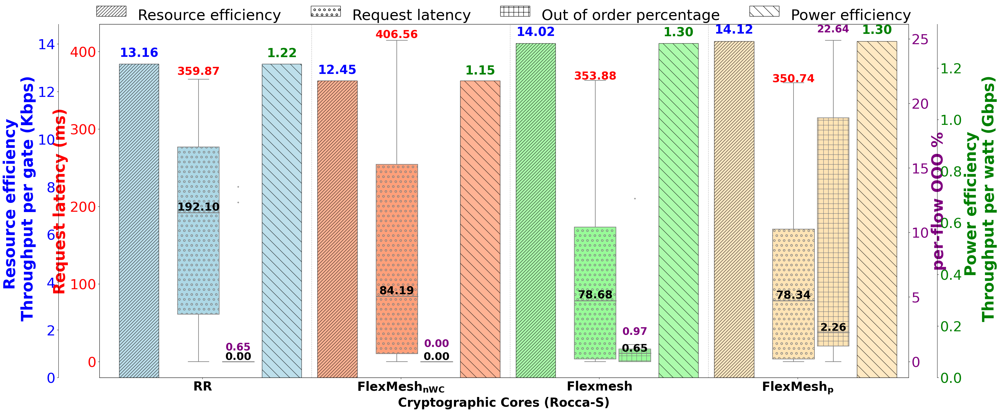

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prepare data
core_types = ['1x_6x_rr', '1x_6x_c', '1x_6x_cs', '1x_6x_amp']

# label_map = {
#     '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
#     '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
#     '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
#     '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
# }

label_map = {
    '1x_6x_rr': r'$\mathbf{RR}$',
    '1x_6x_c': r'$\mathbf{FlexMesh_{nWC}}$',
    '1x_6x_cs': r'$\mathbf{Flexmesh}$',
    '1x_6x_amp': r'$\mathbf{FlexMesh_{p}}$'
}

# Increase spacing between groups - much wider spacing
x = np.array([0, 10, 20, 30]) # Consistent spacing of 3 units
bar_width = 2  # Slightly wider bars
latency_offset = 0.05

# colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(34, 14))  # Wider figure to accommodate spacing

# # Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()


# ax3.spines["right"].set_position(("outward", 60))

# Right Y-axis for Request Latency (closer to the plot)
# ax3 = ax1.twinx()

# ax4 = ax1.twinx()

# # Left Y-axis for Throughput per GE
# # ax4.spines["left"].set_position(("outward", 60))  # Push left Y-axis outward

# # Second right Y-axis for Throughput per Watt (push it outward)
# ax2 = ax1.twinx()
# ax2.spines["right"].set_position(("outward", 60))

# Updated Code

# === Left Y-axis 2 (closer to the plot) ===
ax_left2 = ax1
# ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# === Left Y-axis 1 (further out) ===
ax_left1 = ax1.twinx()
ax_left1.spines["left"].set_position(("outward", 100))
ax_left1.yaxis.set_label_position("left")
ax_left1.yaxis.set_ticks_position("left")
# ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# Hide ax_left1's right spine (twinx adds it by default)
ax_left1.spines["right"].set_visible(False)

# === Right Y-axis 1 ===
ax_right1 = ax1.twinx()
# ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# === Right Y-axis 2 ===
ax_right2 = ax1.twinx()
ax_right2.spines["right"].set_position(("outward", 70))
# ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')





# Bar plot: Throughput per GE (left position - more spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax_left1.bar(x[i] - bar_width*1.6, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax_left1.text(x[i] - bar_width*1.6, val + 0.015 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - more spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax_right2.bar(x[i] + bar_width * 2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    ax_right2.text(x[i] + bar_width *2, val + 0.014 * val, f'{val:.2f}', 
             ha='center', va='bottom', fontsize=30, fontweight='bold', color='green')

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
latency_offset = 0.2
box_latency = ax_left2.boxplot(latency_data, 
                #   positions= x,
                  positions=[pos - latency_offset for pos in x],
                  widths=bar_width * 1.05,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Box plot: OOO  (center position)
ooo_data = [combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage'] for core in core_types]
ooo_offset = bar_width - 0.2
box_ooo = ax_right1.boxplot(ooo_data, 
                #   positions=x, 
                  positions=[pos + ooo_offset for pos in x],
                  widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                #   boxprops=dict(facecolor='none', edgecolor='g', hatch='xxx', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='+', color='purple', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box_latency['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('o')   
    patch.set_alpha(1.0)

for i, patch in enumerate(box_ooo['boxes']):
    patch.set_edgecolor('grey')  # Set edge color for the box
    patch.set_facecolor(colors[i])     # No face color fill
    # patch.set_hatch(hatches[i]) # Hatch pattern on edge
    patch.set_hatch('+')   
    patch.set_alpha(1.0)            

# Annotate Median and P99 for latency values.
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i] - latency_offset # Center position for latency annotations
        ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=27, fontweight='bold', color='black')
        ax_left2.text(xpos, p99 + 0.02 * p99, f'{p99:.2f}', ha='center', va='bottom',
                 fontsize=27, color='red', fontweight='bold')
        
# Annotate Median and P99 for OOO values.
for i, core in enumerate(core_types):

    ooo_vals = combined_ooo_df[combined_ooo_df['core_type'] == core]['Out of Order Percentage']
    if len(ooo_vals) > 0:
        
        if core == '1x_6x_cs':
            median = ooo_vals.median()
            p99 = np.percentile(ooo_vals, 99)
            
            # Set offset so P99 is slightly above median if they overlap (both are zero or close)
            if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
                p99_y = median + 4  # small upward nudge
            else:
                p99_y = p99 + 1 * p99  # proportional upward offset

            
            xpos = x[i] + ooo_offset # Center position for latency annotations

            ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                    fontsize=26, fontweight='bold', color='black')
            ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
                    fontsize=25, color='purple', fontweight='bold')
        else:

            median = ooo_vals.median()
            p99 = np.percentile(ooo_vals, 99)
            
            # Set offset so P99 is slightly above median if they overlap (both are zero or close)
            if abs(p99 - median) < 0.01:  # nearly equal, including both being zero
                p99_y = median + 1  # small upward nudge
            else:
                p99_y = p99 + 0.12 * p99  # proportional upward offset

            
            xpos = x[i] + ooo_offset # Center position for latency annotations

            ax_right1.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                    fontsize=26, fontweight='bold', color='black')
            ax_right1.text(xpos, p99_y, f'{p99:.2f}', ha='center', va='bottom',
                    fontsize=25, color='purple', fontweight='bold')

for xpos in x[:-1]:
    ax1.axvline(x=xpos + 5.5, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax_left1.set_ylabel('Resource efficiency \n Throughput per gate (Kbps)', fontsize=38, fontweight='bold', color='blue')
ax_left2.set_ylabel('Request latency (ms)', fontsize=38, fontweight='bold', color='red')
ax_right1.set_ylabel('per-flow OOO %', fontsize=38, fontweight='bold', color='purple')
ax_right2.set_ylabel('Power efficiency \n Throughput per watt (Gbps)', fontsize=38, fontweight='bold', color='green')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# Color-coded ticks
ax_left1.tick_params(axis='y', labelcolor='blue')
ax_left2.tick_params(axis='y', labelcolor='red')
ax_right1.tick_params(axis='y', labelcolor='purple')
ax_right2.tick_params(axis='y', labelcolor='green')

# ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize = 30,fontweight='bold')

# X-axis with better spacing
ax_left1.set_xticks(x)
ax_left1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=34, fontweight='bold')

ax_left1.set_xlim(x[0] - bar_width * 1.5, x[-1] + bar_width * 1.5)


class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5 ,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]


legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='+', label='Out of order percentage'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\', label='Power efficiency'),
]

# Add legend
# ax1.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 1.12),
#            ncol=3, fontsize=16,  title_fontsize=13, frameon=False)
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.082),
           ncol=4, fontsize=36, frameon=False)

ax_left1.tick_params(axis='y', labelsize=34)
ax_left2.tick_params(axis='y', labelsize=34)
ax_right1.tick_params(axis='y', labelsize=34)
ax_right2.tick_params(axis='y', labelsize=34)


# Remove title and all grids as requested
# plt.title("Performance Comparison of Core Configurations", fontsize=14, fontweight='bold')
ax_left1.set_xlim(x[0] - bar_width * 2.6, x[-1] + bar_width * 2.8)

# ax_left1.set_ylim(0, 85.0)  # Resource efficiency
# ax_left2.set_ylim(0, 2.0)  # Request latency
# ax_right1.set_ylim(0, 2.0)  # Power efficiency
# ax

ax_left1.grid(False)
ax_left2.grid(False)
ax_right1.grid(False)
ax_right2.grid(False)

# Remove legend as requested
# legend_labels = [f"{label_map[c]}" for c in core_types]
# custom_patches = [plt.Rectangle((0, 0), 1, 1, facecolor=colors[i], hatch=hatches[i], edgecolor='black') for i in range(len(core_types))]
# ax1.legend(custom_patches, legend_labels, title="Core Type", loc='upper left', fontsize=10, title_fontsize=11)

# Set x-axis limits to show all data clearly
# ax1.set_xlim(-1, 8)

# Layout
plt.savefig("/home/iiitd/Aditya/Plot_RoccaS/scripts/Mmtc-Dataset-12G/plots_MMTC_RR/Mixed_RR_FlexMesh_vs_FlexMesh_p_1x_6x.png", dpi=300)
plt.tight_layout()
plt.show()

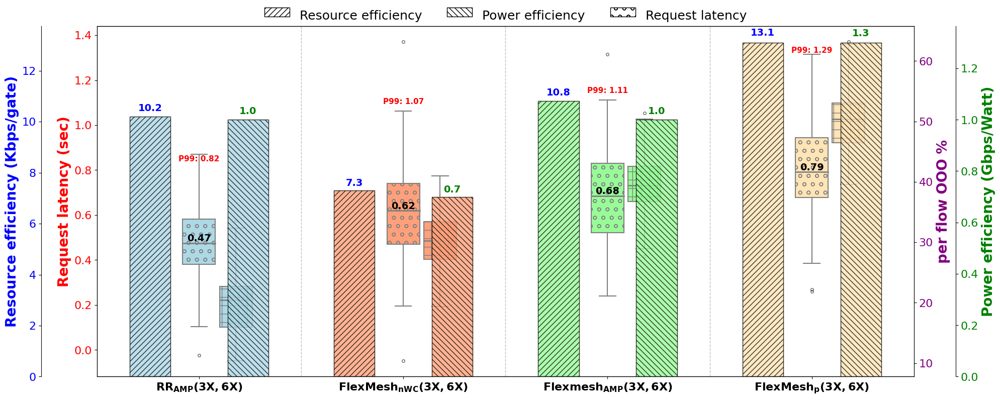

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.legend_handler import HandlerPatch
import matplotlib.patches as mpatches

# Prepare data
core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

label_map = {
    '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
    '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
    '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
    '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
}

# Consistent spacing between groups
x = np.array([0, 2, 4, 6])  # Consistent spacing of 2 units
bar_width = 0.4  # Bar width
latency_offset = 0.05

colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin', 'plum']
hatches = ['///', '\\\\\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(20, 8))  # Wider figure to accommodate spacing

# === Left Y-axis 2 (closer to the plot) ===
ax_left2 = ax1

# === Left Y-axis 1 (further out) ===
ax_left1 = ax1.twinx()
ax_left1.spines["left"].set_position(("outward", 80))
ax_left1.yaxis.set_label_position("left")
ax_left1.yaxis.set_ticks_position("left")

# Hide ax_left1's right spine (twinx adds it by default)
ax_left1.spines["right"].set_visible(False)

# === Right Y-axis 1 ===
ax_right1 = ax1.twinx()

# === Right Y-axis 2 ===
ax_right2 = ax1.twinx()
ax_right2.spines["right"].set_position(("outward", 60))

# Sample data dictionaries (you'll need to replace these with your actual data)
throughput_ge_dict = {
    '3x_6x_rr': 10.2,
    '3x_6x_c': 7.3,
    '3x_6x_cs': 10.8,
    '3x_6x_amp': 13.1
}

throughput_watt_dict = {
    '3x_6x_rr': 1.0,
    '3x_6x_c': 0.7,
    '3x_6x_cs': 1.0,
    '3x_6x_amp': 1.3
}

# Bar plot: Throughput per GE (left position - consistent spacing)
bars_ge = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax_left1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bars_ge.append(bar)
    ax_left1.text(x[i] - bar_width*1.2, val + 0.015 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='blue')

# Bar plot: Throughput per Watt (right position - FIXED spacing)
bars_watt = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    # Fixed positioning: use consistent offset of +bar_width*1.2 (same magnitude as left bars)
    bar = ax_right2.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    # Fixed text positioning: use same offset as bar position
    ax_right2.text(x[i] + bar_width*1.2, val + 0.014 * val, f'{val:.1f}', 
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='green')

# Sample data for boxplots (you'll need to provide your actual DataFrames)
# Creating dummy data for demonstration
np.random.seed(42)
latency_data = []
ooo_data = []

for i in range(len(core_types)):
    # Generate sample latency data
    latency_samples = np.random.normal(0.5 + i*0.1, 0.2, 100)
    latency_data.append(latency_samples)
    
    # Generate sample OOO data
    ooo_samples = np.random.normal(20 + i*10, 5, 100)
    ooo_data.append(ooo_samples)

# Box plot: Latency (center position)
box_latency = ax_left2.boxplot(latency_data, 
                  positions=x,
                  widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Box plot: OOO (right position - consistent with bar spacing)
ooo_offset = bar_width * 0.9
box_ooo = ax_right1.boxplot(ooo_data, 
                  positions=[pos + ooo_offset for pos in x],
                  widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                  medianprops=dict(color='grey', linewidth=2),
                  whiskerprops=dict(color='grey', linewidth=1.5),
                  capprops=dict(color='grey', linewidth=1.5),
                  flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box_latency['boxes']):
    patch.set_edgecolor('grey')
    patch.set_facecolor(colors[i])
    patch.set_hatch('o')   
    patch.set_alpha(1.0)

for i, patch in enumerate(box_ooo['boxes']):
    patch.set_edgecolor('grey')
    patch.set_facecolor(colors[i])
    patch.set_hatch('+')   
    patch.set_alpha(1.0)            

# Annotate Median and P99 for latency values
for i in range(len(core_types)):
    lat_vals = latency_data[i]
    if len(lat_vals) > 0:
        median = np.median(lat_vals)
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i]
        ax_left2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=14, fontweight='bold', color='black')
        ax_left2.text(xpos, p99 + 0.02 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
                 fontsize=11, color='red', fontweight='bold')

# Add vertical dividers between groups
for xpos in x[:-1]:
    ax1.axvline(x=xpos + 1, color='gray', linestyle='--', linewidth=1, alpha=0.5)

# Axis Labels
ax_left1.set_ylabel('Resource efficiency (Kbps/gate)', fontsize=20, fontweight='bold', color='blue')
ax_left2.set_ylabel('Request latency (sec)', fontsize=20, fontweight='bold', color='red')
ax_right1.set_ylabel('per flow OOO %', fontsize=20, fontweight='bold', color='purple')
ax_right2.set_ylabel('Power efficiency (Gbps/Watt)', fontsize=20, fontweight='bold', color='green')

# Color-coded ticks
ax_left1.tick_params(axis='y', labelcolor='blue')
ax_left2.tick_params(axis='y', labelcolor='red')
ax_right1.tick_params(axis='y', labelcolor='purple')
ax_right2.tick_params(axis='y', labelcolor='green')

ax_left1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize=22, fontweight='bold')

# X-axis with better spacing
ax_left1.set_xticks(x)
ax_left1.set_xticklabels([label_map[c] for c in core_types])

plt.setp(ax1.get_xticklabels(), fontsize=30, fontweight='bold')

# Set consistent x-axis limits with proper spacing
ax_left1.set_xlim(x[0] - bar_width * 2.5, x[-1] + bar_width * 2.5)

class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent+height/3), width, height + 0.5,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\\\\\', label='Power efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='o', label='Request latency'),
]

# Add legend
ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.078),
           ncol=3, fontsize=18, frameon=False)

ax_left1.tick_params(axis='both', labelsize=16)
ax_left2.tick_params(axis='both', labelsize=16)
ax_right1.tick_params(axis='both', labelsize=16)
ax_right2.tick_params(axis='both', labelsize=16)

# Remove grids
ax_left1.grid(False)
ax_left2.grid(False)
ax_right1.grid(False)
ax_right2.grid(False)

# Layout
plt.tight_layout()
plt.show()

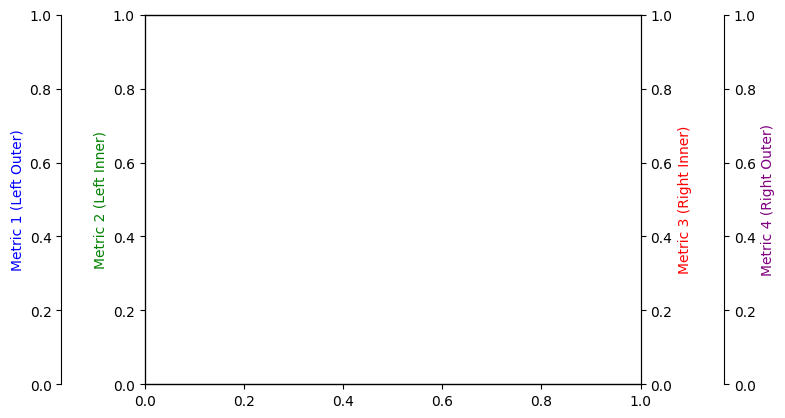

In [12]:
import matplotlib.pyplot as plt

fig, ax_base = plt.subplots()

# === Left Y-axis 2 (closer to the plot) ===
ax_left2 = ax_base
ax_left2.set_ylabel('Metric 2 (Left Inner)', color='green')

# === Left Y-axis 1 (further out) ===
ax_left1 = ax_base.twinx()
ax_left1.spines["left"].set_position(("outward", 60))
ax_left1.yaxis.set_label_position("left")
ax_left1.yaxis.set_ticks_position("left")
ax_left1.set_ylabel('Metric 1 (Left Outer)', color='blue')

# Hide ax_left1's right spine (twinx adds it by default)
ax_left1.spines["right"].set_visible(False)

# === Right Y-axis 1 ===
ax_right1 = ax_base.twinx()
ax_right1.set_ylabel('Metric 3 (Right Inner)', color='red')

# === Right Y-axis 2 ===
ax_right2 = ax_base.twinx()
ax_right2.spines["right"].set_position(("outward", 60))
ax_right2.set_ylabel('Metric 4 (Right Outer)', color='purple')

# Optional: remove overlapping patches
for ax in [ax_left1, ax_right1, ax_right2]:
    ax.set_zorder(ax_base.get_zorder() + 1)
    ax.patch.set_visible(False)

plt.show()


ValueError: X must have 2 or fewer dimensions

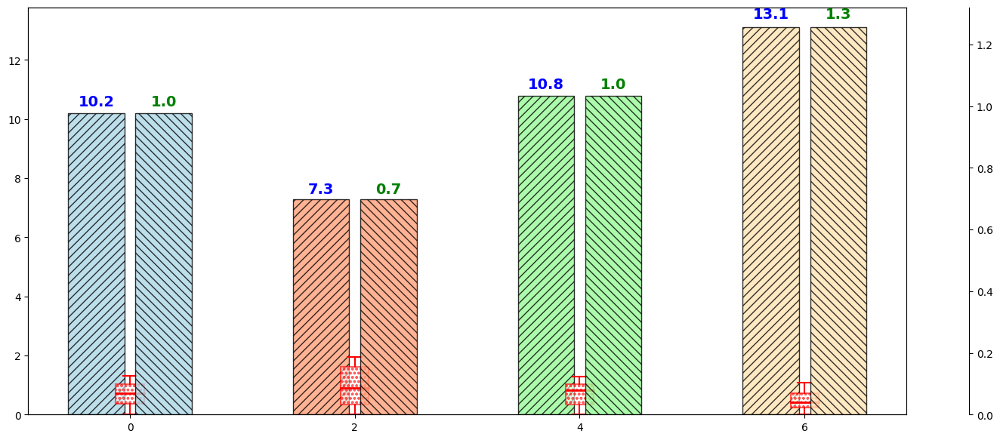

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch

# Prepare data
core_types = ['3x_6x_rr', '3x_6x_c', '3x_6x_cs', '3x_6x_amp']

label_map = {
    '3x_6x_rr': r'$\mathbf{RR_{AMP}(3X,6X)}$',
    '3x_6x_c': r'$\mathbf{FlexMesh_{nWC}(3X,6X)}$',
    '3x_6x_cs': r'$\mathbf{Flexmesh_{AMP}(3X,6X)}$',
    '3x_6x_amp': r'$\mathbf{FlexMesh_{p}(3X,6X)}$'
}

x = np.array([0, 2, 4, 6])  # Adjusted to match length of core_types
bar_width = 0.5

colors = ['lightblue', 'lightsalmon', 'palegreen', 'moccasin','moccasin']
hatches = ['///', '\\\\\\', '---', '\\\///']

fig, ax1 = plt.subplots(figsize=(15, 7))

# Right Y-axis
ax2 = ax1.twinx()
ax2.spines["right"].set_position(("outward", 60))

# LEFT Y-AXIS: Resource efficiency bar
bars_res_eff = []
for i, core in enumerate(core_types):
    val = throughput_ge_dict[core]
    bar = ax1.bar(x[i] - bar_width * 0.6, val, width=bar_width,
                  color=colors[i], hatch=hatches[0], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Resource Eff.")
    bars_res_eff.append(bar)
    ax1.text(x[i] - bar_width * 0.6, val + 0.015 * val, f'{val:.1f}',
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='blue')

# LEFT Y-AXIS: Request latency boxplot
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
box_latency = ax1.boxplot(latency_data, positions=x, widths=bar_width * 0.5,
                          patch_artist=True,
                          boxprops=dict(facecolor='white', color='red', linewidth=1.5),
                          medianprops=dict(color='red', linewidth=2),
                          whiskerprops=dict(color='red', linewidth=1.5),
                          capprops=dict(color='red', linewidth=1.5),
                          flierprops=dict(marker='o', color='red', alpha=0.6, markersize=4))

for patch in box_latency['boxes']:
    patch.set_hatch('ooo')
    patch.set_alpha(0.6)

# RIGHT Y-AXIS: Power efficiency bar
bars_power_eff = []
for i, core in enumerate(core_types):
    val = throughput_watt_dict[core]
    bar = ax2.bar(x[i] + bar_width * 0.6, val, width=bar_width,
                  color=colors[i], hatch=hatches[1], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Power Eff.")
    bars_power_eff.append(bar)
    ax2.text(x[i] + bar_width * 0.6, val + 0.015 * val, f'{val:.1f}',
             ha='center', va='bottom', fontsize=14, fontweight='bold', color='green')

# RIGHT Y-AXIS: Out-of-Order metric boxplot
box_ooo = ax2.boxplot(ooo_data, positions=x + bar_width * 1.6, widths=bar_width * 0.5,
                      patch_artist=True,
                      boxprops=dict(facecolor='white', color='green', linewidth=1.5),
                      medianprops=dict(color='green', linewidth=2),
                      whiskerprops=dict(color='green', linewidth=1.5),
                      capprops=dict(color='green', linewidth=1.5),
                      flierprops=dict(marker='x', color='green', alpha=0.6, markersize=4))

for patch in box_ooo['boxes']:
    patch.set_hatch('xxx')
    patch.set_alpha(0.6)

# Axis Labels
ax1.set_ylabel('Resource efficiency (Kbps/gate) & Request latency (sec)', fontsize=16, fontweight='bold', color='blue')
ax2.set_ylabel('Power efficiency (Gbps/Watt) & Out-of-Order metric', fontsize=16, fontweight='bold', color='green')

ax1.set_xlabel("Cryptographic Cores (Rocca-S)", fontsize=18, fontweight='bold')

# X-axis with labels
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=14)

# Tick colors
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='green')

# Legends for the patterns
legend_elements = [
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='///', label='Resource efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='ooo', label='Request latency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='\\\\\\', label='Power efficiency'),
    mpatches.Patch(facecolor='white', edgecolor='black', hatch='xxx', label='Out-of-Order metric'),
]

class CenteredHandler(HandlerPatch):
    def create_artists(self, legend, orig_handle, xdescent, ydescent, width, height, fontsize, trans):
        center = mpatches.Rectangle(
            (xdescent, ydescent + height/3), width, height + 0.5,
            facecolor=orig_handle.get_facecolor(),
            edgecolor=orig_handle.get_edgecolor(),
            hatch=orig_handle.get_hatch(),
            transform=trans
        )
        return [center]

ax1.legend(handles=legend_elements,
           handler_map={mpatches.Patch: CenteredHandler()},
           loc='upper center', bbox_to_anchor=(0.5, 1.05),
           ncol=4, fontsize=14, frameon=False)

# Layout
plt.tight_layout()
plt.show()


ValueError: List of boxplot statistics and `positions` values must have same the length

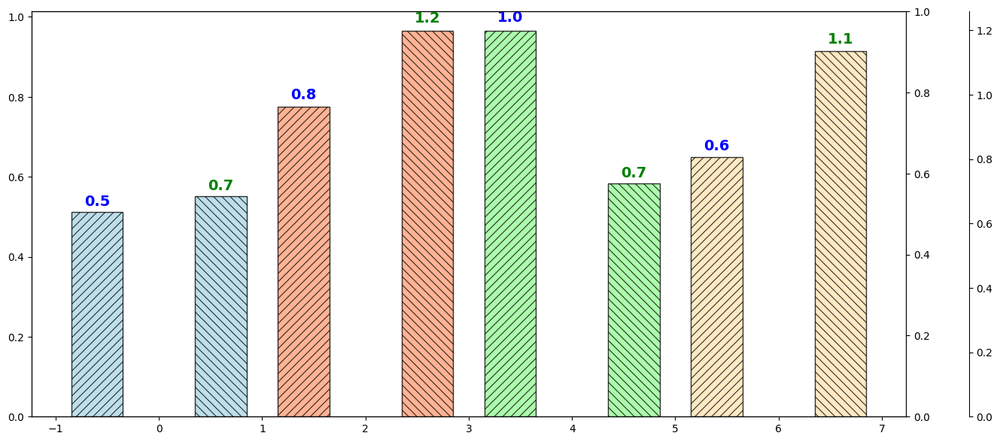

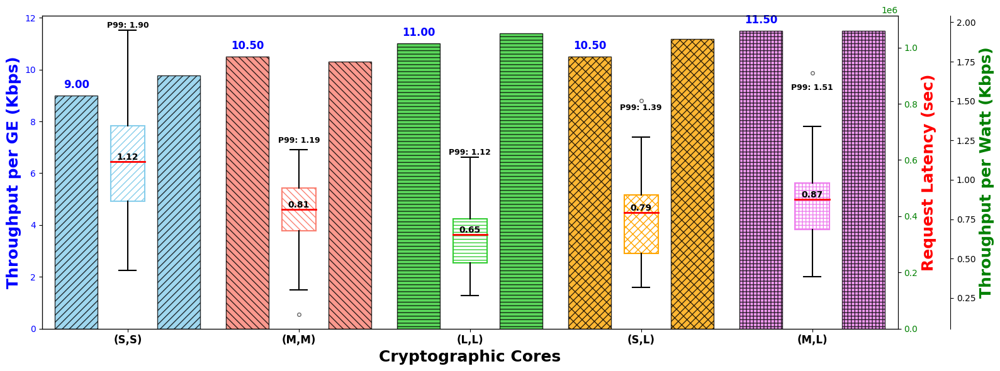

In [17]:

# 1. Increase spacing between groups for x-axis labels
# By increasing the step size (e.g., from 2 to 3), we create more space between each group of plots.
x = np.array([0, 2, 4.0, 6, 8.0]) # Consistent spacing of 2.5 units
bar_width = 0.5  # Keep bar width as is
latency_offset = 0.05

colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
hatches = ['///', '\\\\\\', '---', '\\\///', '+++']

# Adjust figsize to accommodate the increased x-axis range and for a more rectangular shape
fig, ax1 = plt.subplots(figsize=(16, 6)) # Increased width to fit the wider x-range

# Right Y-axis for Throughput per Watt
# ax2 = ax1.twinx()

# # Second right Y-axis for Latency
# ax3 = ax1.twinx()
# ax3.spines["right"].set_position(("outward", 60))

# Define Y-axes in the new desired order:
# ax1 (left): Throughput per GE (stays)
# ax2 (right, first): Request Latency (previously ax3)
# ax3 (right, second, offset): Throughput per Watt (previously ax2)
ax2 = ax1.twinx() # This will now be for Request Latency
ax3 = ax1.twinx() # This will now be for Throughput per Watt
ax3.spines["right"].set_position(("outward", 60)) # Apply offset to the new ax3



# Bar plot: Throughput per GE (left position)
# bars_ge = []
# for i, core in enumerate(core_types):
#     bar = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
#                   color=colors[i], hatch=hatches[i], edgecolor='black',
#                   alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
#     bars_ge.append(bar)
bars_ge = []
for i, core in enumerate(core_types):
    bar_container = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                            color=colors[i], hatch=hatches[i], edgecolor='black',
                            alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bar = bar_container[0] # Get the individual bar (Rectangle object)
    bars_ge.append(bar)
    # ADD ANNOTATION FOR THROUGHPUT PER GE
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.2, # Adjust 0.2 offset as needed
             f'{throughput_ge_dict[core]:.2f}', # Format to one decimal place
             ha='center', va='bottom', fontsize=12, fontweight='bold', color='blue') # Match axis label color

# Bar plot: Throughput per Watt (right position)
bars_watt = []
for i, core in enumerate(core_types):
    bar = ax2.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width,
                  color=colors[i], hatch=hatches[i], edgecolor='black',
                  alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bars_watt.append(bar)
    

# Box plot: Latency (center position)
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
box = ax3.boxplot(latency_data, positions=x, widths=bar_width * 0.8,
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                  medianprops=dict(color='red', linewidth=2),
                  whiskerprops=dict(color='black', linewidth=1.5),
                  capprops=dict(color='black', linewidth=1.5),
                  flierprops=dict(marker='o', color='black', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch
for i, patch in enumerate(box['boxes']):
    patch.set_edgecolor(colors[i])  # Set edge color for the box
    patch.set_facecolor('none')      # No face color fill
    patch.set_hatch(hatches[i])      # Hatch pattern on edge
    patch.set_alpha(1.0)

# Annotate Median and P99
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i]  # Center position for latency annotations
        ax3.text(xpos, median, f'{median:.2f}', ha='center', va='bottom',
                 fontsize=10, fontweight='bold', color='black')
        ax3.text(xpos, p99 + 0.03 * p99, f'P99: {p99:.2f}', ha='center', va='bottom',
                 fontsize=9, color='black', fontweight='bold')

# Axis Labels
ax1.set_ylabel('Throughput per GE (Kbps)', fontsize=18, fontweight='bold', color='blue')
ax2.set_ylabel('Request Latency (sec)', fontsize=18, fontweight='bold', color='red')
ax3.set_ylabel('Throughput per Watt (Kbps)', fontsize=18, fontweight='bold', color='green')

# Color-coded ticks
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='green')
ax3.tick_params(axis='y', labelcolor='black')

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=12, fontweight='bold')
ax1.set_xlabel("Cryptographic Cores", fontsize = 18,fontweight='bold')

# Remove title and all grids as requested
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Remove legend as requested

# 2. Correctly set x-axis limits to eliminate right-side space
# The previous hardcoded `ax1.set_xlim(-1, 10)` was causing the issue.
# We now calculate the limits dynamically based on the first and last x-positions
# and add a small padding (e.g., 1.5 times bar_width) to ensure all bars are visible
# without excessive empty space.
left_edge = x[0] - bar_width * 1.2 # Position of the leftmost bar of the first group
right_edge = x[-1] + bar_width * 1.2 # Position of the rightmost bar of the last group

ax1.set_xlim(left_edge - bar_width * 0.80, right_edge + bar_width * 0.80)

# Layout
plt.tight_layout()
plt.show()

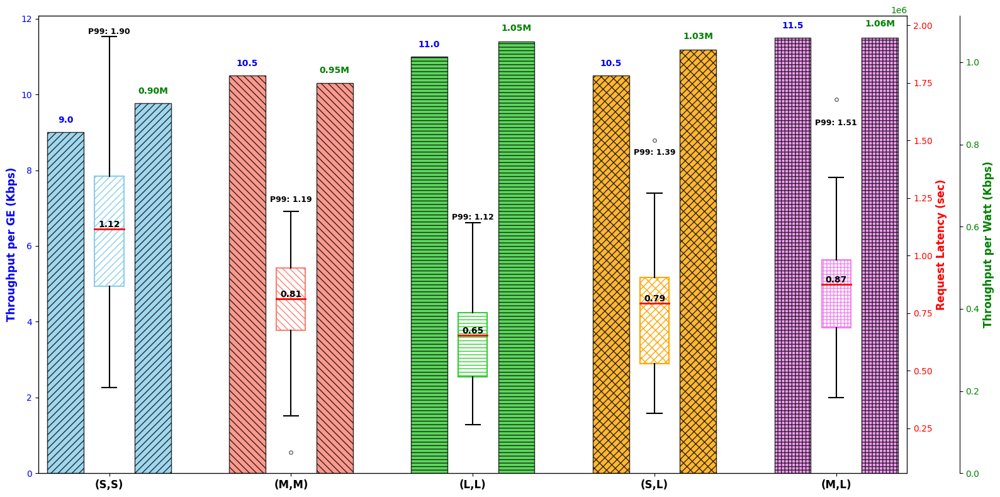

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Prepare data (inferred from previous interactions, replace with your actual data)
core_types = ['1x_1x', '3x_3x', '6x_6x', '1x_6x_cs', '3x_6x_cs']
label_map = {
    '1x_1x': '(S,S)',
    '3x_3x': '(M,M)',
    '6x_6x': '(L,L)',
    '1x_6x_cs': '(S,L)',
    '3x_6x_cs': '(M,L)',
}



np.random.seed(42) # for reproducibility
latency_data_raw = {}
latency_data_raw['1x_1x'] = np.clip(np.random.normal(1.21, 0.4, 50), 0.1, 3.0)
latency_data_raw['3x_3x'] = np.clip(np.random.normal(0.80, 0.25, 50), 0.1, 2.0)
latency_data_raw['6x_6x'] = np.clip(np.random.normal(0.65, 0.2, 50), 0.1, 1.5)
latency_data_raw['1x_6x_cs'] = np.clip(np.random.normal(0.74, 0.28, 50), 0.1, 2.0)
latency_data_raw['3x_6x_cs'] = np.clip(np.random.normal(0.83, 0.22, 50), 0.1, 1.8)
all_delays = []
all_core_types = []
for core_type in core_types:
    all_delays.extend(latency_data_raw[core_type])
    all_core_types.extend([core_type] * len(latency_data_raw[core_type]))
combined_df = pd.DataFrame({'core_type': all_core_types, 'processing_delay': all_delays})


# Consistent spacing of 2.5 units between group centers
x = np.array([0, 2.5, 5.0, 7.5, 10.0])
bar_width = 0.5
latency_offset = 0.05 # This offset is now less relevant as latency is on ax2, not ax3 position wise

colors = ['skyblue', 'salmon', 'limegreen', 'orange', 'violet']
hatches = ['///', '\\\\\\', '---', '\\\///', '+++']

fig, ax1 = plt.subplots(figsize=(16, 8)) # Wider figure for better visibility

# Define Y-axes in the desired order:
# ax1 (left): Throughput per GE
# ax2 (right, first): Request Latency
# ax3 (right, second, offset): Throughput per Watt
ax2 = ax1.twinx() # This will now be for Request Latency
ax3 = ax1.twinx() # This will now be for Throughput per Watt
ax3.spines["right"].set_position(("outward", 60)) # Apply offset to the new ax3

# Bar plot: Throughput per GE (left position) - on ax1
bars_ge = []
for i, core in enumerate(core_types):
    bar_container = ax1.bar(x[i] - bar_width*1.2, throughput_ge_dict[core], width=bar_width,
                            color=colors[i], hatch=hatches[i], edgecolor='black',
                            alpha=0.8, linewidth=1, label=f"{label_map[core]} - GE")
    bar = bar_container[0] # Get the individual bar (Rectangle object)
    bars_ge.append(bar)
    # ADD ANNOTATION FOR THROUGHPUT PER GE
    ax1.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.2, # Adjust 0.2 offset as needed
             f'{throughput_ge_dict[core]:.1f}', # Format to one decimal place
             ha='center', va='bottom', fontsize=10, fontweight='bold', color='blue') # Match axis label color


# Box plot: Latency (center position) - NOW PLOTTED ON ax2
latency_data = [combined_df[combined_df['core_type'] == core]['processing_delay'] for core in core_types]
box = ax2.boxplot(latency_data, positions=x, widths=bar_width * 0.8, # Plot on ax2
                  patch_artist=True,
                  boxprops=dict(facecolor='white', color='black', linewidth=1.5),
                  medianprops=dict(color='red', linewidth=2),
                  whiskerprops=dict(color='black', linewidth=1.5),
                  capprops=dict(color='black', linewidth=1.5),
                  flierprops=dict(marker='o', color='black', alpha=0.6, markersize=4))

# Custom boxplot colors/hatch - apply to ax2's boxplot
for i, patch in enumerate(box['boxes']):
    patch.set_edgecolor(colors[i])
    patch.set_facecolor('none')
    patch.set_hatch(hatches[i])
    patch.set_alpha(1.0)

# Annotate Median and P99 - these annotations are for latency, so they follow ax2's data
for i, core in enumerate(core_types):
    lat_vals = combined_df[combined_df['core_type'] == core]['processing_delay']
    if len(lat_vals) > 0:
        median = lat_vals.median()
        p99 = np.percentile(lat_vals, 99)
        xpos = x[i]
        ax2.text(xpos, median, f'{median:.2f}', ha='center', va='bottom', # Annotate on ax2
                 fontsize=10, fontweight='bold', color='black')
        ax2.text(xpos, p99 + 0.03 * p99, f'P99: {p99:.2f}', ha='center', va='bottom', # Annotate on ax2
                 fontsize=9, color='black', fontweight='bold')


# Bar plot: Throughput per Watt (right position) - NOW PLOTTED ON ax3
bars_watt = []
for i, core in enumerate(core_types):
    bar_container = ax3.bar(x[i] + bar_width*1.2, throughput_watt_dict[core], width=bar_width, # Plot on ax3
                            color=colors[i], hatch=hatches[i], edgecolor='black',
                            alpha=0.8, linewidth=1, label=f"{label_map[core]} - Watt")
    bar = bar_container[0] # Get the individual bar (Rectangle object)
    bars_watt.append(bar)
    # ADD ANNOTATION FOR THROUGHPUT PER WATT
    # Note: Throughput per Watt values are large (e.g., 0.9e6). Format without scientific notation.
    # Adjust 0.02 offset as needed. Multiplying by max value helps scale offset with y-axis.
    ax3.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02 * ax3.get_ylim()[1],
             f'{throughput_watt_dict[core]/1e6:.2f}M', # Format to millions, e.g., 0.90M
             ha='center', va='bottom', fontsize=10, fontweight='bold', color='green')


# Axis Labels - Updated order and colors
ax1.set_ylabel('Throughput per GE (Kbps)', fontsize=12, fontweight='bold', color='blue')
ax2.set_ylabel('Request Latency (sec)', fontsize=12, fontweight='bold', color='red')
ax3.set_ylabel('Throughput per Watt (Kbps)', fontsize=12, fontweight='bold', color='green')

# Color-coded ticks - Updated order and colors
ax1.tick_params(axis='y', labelcolor='blue')
ax2.tick_params(axis='y', labelcolor='red')   # Corrected: Latency is on ax2, color red
ax3.tick_params(axis='y', labelcolor='green') # Corrected: Watt is on ax3, color green

# X-axis with better spacing
ax1.set_xticks(x)
ax1.set_xticklabels([label_map[c] for c in core_types], fontsize=12, fontweight='bold')

# Remove title and all grids as requested
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

# Set x-axis limits to ensure nothing is cut off and minimize extra space
left_edge = x[0] - bar_width * 1.2
right_edge = x[-1] + bar_width * 1.2
ax1.set_xlim(left_edge - bar_width * 0.75, right_edge + bar_width * 0.75)

# Layout
plt.tight_layout()
plt.show()